<div>
<img src=https://www.institutedata.com/wp-content/uploads/2019/10/iod_h_tp_primary_c.svg width="300">
</div>

# Spot the Hits!

## Predicting the Next Viral Song Based on Audio Attributes: Insights From the Top Songs on Spotify in 2024

### Mariel Yap - Institute of Data - August 2024

## Step 1: Define the problem or question

The subject matter being dealt with is track popularity on music streaming platforms. Music streaming is a competitive industry as users utilise these platforms to search for music they love and to access and engage with new and trending popular music. Services such as Spotify have made accessing this music even easier. Understanding the elements that contribute to a track's popularity is essential for these music platforms as it impacts user engagement, retention, and ultimately revenue.

The business question being answered is **"To what extent do audio features of songs contribute to a track's popularity on Spotify, and can we predict the popularity of a track on Spotify using its audio features?"** This question will utilise the metadata of songs to predict the popularity of tracks, which will contribute to improving Spotify’s recommendation systems and enhance user experience content strategies.

## Step 2: Find the data

### Top Spotify Songs in 73 Countries (Daily Updated)

The data is sourced from Kaggle and the dataset is titled “Top Spotify Songs in 73 Countries (Daily Updated)” uploaded by user Asaniczka and can be downloaded at this link: https://www.kaggle.com/datasets/asaniczka/top-spotify-songs-in-73-countries-daily-updated/data. The dataset captured daily the top 50 songs on Spotify for 70 countries and the data capture range is from 18 October 2023 to 29 July 2024.

### Data Dictionary

| Variable |                                 Definition | Value Range                                            |
|----------|-------------------------------------------:|------------------------------------------------|
| spotify_id | Unique identifier for the song in the Spotify database |                |
| name | Title of the song |                      |
| artists | Artists associated with the song |                                                |
| daily_rank | The daily rank of the song in the top 50 list | 1 to 50                                         |
| daily_movement | The change in rankings compared to the previous day |                                        |
| weekly_movement | The change in rankings compared to the previous week |                                   |
| country | The ISO code of the country of the Top 50 Playlist. If Null, then the playlist if 'Global Top 50' | AR	= Argentina, AU = Australia, AT = Austria, BE	= Belgium, BO = Bolivia, BR	= Brazil, BG = Bulgaria, CL	= Chile, CO	= Colombia, CR = Costa Rica, CY	= Cyprus, CZ = Czech Republic, DK = Denmark, DO	= Dominican Republic, EC = Ecuador, SV = El Salvador, EE = Estonia, FI = Finland, FR = France, DE	= Germany, GR = Greece, GT = Guatemala, HN = Honduras, HK = Hong Kong, HU = Hungary, IS	= Iceland, IE = Ireland, IT	= Italy, LV	= Latvia, LI = Liechtenstein, LT = Lithuania, LU = Luxembourg, MY = Malaysia, MT = Malta, MX = Mexico, MC = Monaco, NL = Netherlands, NZ = New Zealand, NI = Nicaragua, NO = Norway, PA	= Panama, PY = Paraguay, PE = Peru, PH = Philippines, PL = Poland, PT	= Portugal, SG = Singapore, SK = Slovakia, ES = Spain, SE = Sweden, CH	= Switzerland, TW = Taiwan, TR = Turkey, GB	= United Kingdom, UY = Uruguay, US = USA | 
| snapshot_date | The date on which the data was collected from the Spotify API                             |
| popularity | A measure of the song's current popularity on Spotify | 1 to 100                |
| is_explicit | Indicates whether the song contains explicit lyrics | 0 = No, 1 = Yes |
| duration_ms | Duration of the song in milliseconds |
| album_name | Title of the album the song belongs to |
| album_release_date | Release date of the album the song belongs to |
| danceability | Measure of how suitable the song is for dancing | 0 to 1 |
| energy | Measure of the intensity and activity level of the song | 0 to 1 |
| key | Key of the song | 0 = C, 1 = C#/Db, 2 = D, 3 = D#/Eb, 4 = E, 5 = F, 6 = F#/Gb, 7 = G, 9 = A, 10 = A#/Bb, 11 = B |
| loudness | Overall loudness of the song in decibels |  |
| mode | Indicates whether the song is in a major or minor key | 0 = minor, 1 = major |
| speechiness | Measure of the presence of spoken words in the song | 0 to 1 |
| acousticness | Measure of the acoustic quality of the song | 0 to 1 |
| instrumentalness | Measure of the likelihood that the song does not contain vocals | 0 to 1 |
| liveness | Measure of the presence of a live audience in the recording | 0 to 1 |
| valence | Measure of the musical positiveness conveyed by the song | 0 to 1 |
| tempo | Tempo of the song in beats per minute |
| time_signature | Estimated overall time signature of the song | Beats per bar over 4 |	USA

In [75]:
# pip install pycaret

In [623]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')

from scipy import stats

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, BayesianRidge, Ridge, LassoCV, Lasso
from sklearn.ensemble import AdaBoostRegressor, ExtraTreesRegressor, GradientBoostingRegressor, RandomForestRegressor, BaggingRegressor, StackingRegressor
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score, GridSearchCV, cross_val_predict
from sklearn.feature_selection import RFE, RFECV
from sklearn.decomposition import PCA
from sklearn import metrics

from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from pycaret.regression import *

from mlxtend.plotting import plot_learning_curves
import shap

import warnings

In [407]:
pd.options.display.float_format = '{:.4f}'.format # Set all outputs of pandas DataFrames to 4 decimal places
warnings.filterwarnings('ignore')

## Step 3: Read the data
- Read the data
- Perform basic structural cleaning to view the data

In [3]:
# read csv file
df = pd.read_csv('universal_top_spotify_songs.csv')

df.head(10)

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,7tI8dRuH2Yc6RuoTjxo4dU,Who,Jimin,1,0,2,NaN,2024-07-29,92,False,...,0,-3.7430,0,0.0320,0.0029,0.0000,0.1930,0.8380,116.0340,4
1,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,Billie Eilish,2,0,-1,NaN,2024-07-29,99,False,...,2,-10.1710,1,0.0358,0.2000,0.0608,0.1170,0.4380,104.9780,4
2,2qSkIjg1o9h3YT9RAgYN75,Espresso,Sabrina Carpenter,3,0,-1,NaN,2024-07-29,99,True,...,0,-5.4780,1,0.0285,0.1070,0.0001,0.1850,0.6900,103.9690,4
3,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,Sabrina Carpenter,4,0,0,NaN,2024-07-29,98,True,...,9,-6.0730,1,0.0540,0.2740,0.0000,0.1040,0.5790,107.0710,4
4,6XjDF6nds4DE2BBbagZol6,Gata Only,"FloyyMenor, Cris Mj",5,0,1,NaN,2024-07-29,96,True,...,8,-8.4720,0,0.0509,0.4460,0.0000,0.0899,0.6690,99.9860,4
5,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,Kendrick Lamar,6,1,-1,NaN,2024-07-29,97,True,...,1,-7.0010,1,0.0776,0.0107,0.0000,0.1410,0.2140,101.0610,4
6,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",Chappell Roan,7,1,0,NaN,2024-07-29,96,False,...,11,-5.9600,0,0.0356,0.0502,0.0000,0.0881,0.7850,116.7120,4
7,6WatFBLVB0x077xWeoVc2k,Si Antes Te Hubiera Conocido,KAROL G,8,-2,0,NaN,2024-07-29,94,False,...,11,-6.7950,1,0.0469,0.4460,0.0006,0.0678,0.7870,128.0270,4
8,5fZJQrFKWQLb7FpJXZ1g7K,A Bar Song (Tipsy),Shaboozey,9,1,0,NaN,2024-07-29,88,True,...,9,-4.8570,1,0.0292,0.0720,0.0000,0.0670,0.5990,80.9690,4
9,3xkHsmpQCBMytMJNiDf3Ii,Beautiful Things,Benson Boone,10,-1,0,NaN,2024-07-29,91,False,...,10,-5.6920,1,0.0603,0.1510,0.0000,0.1400,0.2190,105.0290,3


In [4]:
# Check preliminary info of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1029803 entries, 0 to 1029802
Data columns (total 25 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   spotify_id          1029803 non-null  object 
 1   name                1029776 non-null  object 
 2   artists             1029776 non-null  object 
 3   daily_rank          1029803 non-null  int64  
 4   daily_movement      1029803 non-null  int64  
 5   weekly_movement     1029803 non-null  int64  
 6   country             1015846 non-null  object 
 7   snapshot_date       1029803 non-null  object 
 8   popularity          1029803 non-null  int64  
 9   is_explicit         1029803 non-null  bool   
 10  duration_ms         1029803 non-null  int64  
 11  album_name          1029276 non-null  object 
 12  album_release_date  1029418 non-null  object 
 13  danceability        1029803 non-null  float64
 14  energy              1029803 non-null  float64
 15  key            

On initial viewing of the data types, most are in line with expectations. Snapshot date and album release date can be improved by converting to date-time type.

Column names are appropriate and do not need to be changed.

In [5]:
df.describe()

,daily_rank,daily_movement,weekly_movement,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000,1029803.0000
mean,25.4889,0.7967,2.6362,76.8062,192927.4629,0.6853,0.6508,5.5019,-6.4631,0.5403,0.0961,0.2725,0.0176,0.1715,0.5464,122.4321,3.9024
std,14.4282,6.7373,12.0115,16.0412,50598.5650,0.1377,0.1632,3.5641,2.6099,0.4984,0.0907,0.2505,0.0941,0.1254,0.2288,28.1872,0.4150
min,1.0000,-49.0000,-49.0000,0.0000,0.0000,0.0000,0.0000,0.0000,-37.3340,0.0000,0.0000,0.0000,0.0000,0.0139,0.0000,0.0000,0.0000
25%,13.0000,-1.0000,-3.0000,66.0000,160517.0000,0.5940,0.5510,2.0000,-7.8050,0.0000,0.0400,0.0690,0.0000,0.0961,0.3680,99.9930,4.0000
50%,25.0000,0.0000,0.0000,81.0000,185241.0000,0.7040,0.6710,6.0000,-6.0100,1.0000,0.0587,0.1830,0.0000,0.1190,0.5450,119.9840,4.0000
75%,38.0000,2.0000,5.0000,89.0000,217894.0000,0.7890,0.7640,9.0000,-4.7520,1.0000,0.1120,0.4340,0.0001,0.2110,0.7310,140.4670,4.0000
max,50.0000,49.0000,49.0000,100.0000,939666.0000,0.9880,0.9980,11.0000,3.2330,1.0000,0.9210,0.9960,0.9740,0.9780,0.9920,227.8950,5.0000


Most columns are within expectations for the minimum and maximum figures. Some items which can be cleaned are noted also below.
- Popularity is on a scale of 1 to 100
- Duration may be more useful to update to seconds rather than milliseconds
- Danceability, energy, speechiness, acousticness, instrumentalness, liveness and valence are on a scale of 0 to 1
- It is noted that key is on a scale of 1 to 11, which is not as useful to reference to as musical keys. Would be worth converting this.

## Step 4: Explore and clean the data
- Handle missing values
- Convert data types
- Handle duplicates
- Check distribution
- Check for outliers
- Visualisation 

### Data types

In [6]:
# Convert snapshot data and album release date to datetime object
df['snapshot_date'] = pd.to_datetime(df['snapshot_date'])
df['album_release_date'] = pd.to_datetime(df['album_release_date'])

In [7]:
# Convert duration_ms to seconds and relabel to duration_sec
df['duration_ms'] = df['duration_ms'] / 1000 # 1000 milliseconds in a second
df = df.rename(columns = {'duration_ms': 'duration_sec'})

### Drop unnecessary data

In [8]:
# Drop records where the snapshot_date, which is the date of the chart collection is in 2023, as for the project we only 
# require songs charted in 2024
cutoff_date = pd.Timestamp('2024-01-01')
df = df[df['snapshot_date'] >= cutoff_date]

### Missing values

In [9]:
# Check null values
df.isnull().sum()

spotify_id                0
name                      5
artists                   5
daily_rank                0
daily_movement            0
weekly_movement           0
country               10251
snapshot_date             0
popularity                0
is_explicit               0
duration_sec              0
album_name              352
album_release_date      210
danceability              0
energy                    0
key                       0
loudness                  0
mode                      0
speechiness               0
acousticness              0
instrumentalness          0
liveness                  0
valence                   0
tempo                     0
time_signature            0
dtype: int64

Null values are present within the name, artists, country, album_name, and album_release_date columns. As per the data dictionary of the dataset, we can infer that the null values in the 'country' denote the global chart.

In [10]:
# Remove records where name and artist are null as these songs will not be able to be identified regardless of other info
# Additionally drop records where album_release_date is null
df = df.dropna(subset = ['name', 'artists', 'album_release_date'])

In [11]:
# For the columns album_name since inputing this information will also be difficult and the info
# is not required for predicting track popularity, the column will be dropped entirely
df = df.drop(['album_name'], axis = 1)

In [12]:
# As per the data dictionary, null values in country indicate the global chart. All null values will be imputed with 'Global'
df['country'] = df['country'].fillna('Global')

In [13]:
# Check null values once again to see if they all have been dealt with
df.isnull().sum()

spotify_id            0
name                  0
artists               0
daily_rank            0
daily_movement        0
weekly_movement       0
country               0
snapshot_date         0
popularity            0
is_explicit           0
duration_sec          0
album_release_date    0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
time_signature        0
dtype: int64

### Duplicates

In [14]:
# Check for duplicate songs by matching spotify_id
df[df.duplicated(subset = ['spotify_id'])]

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
51,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,Kendrick Lamar,2,0,0,ZA,2024-07-29,97,True,...,1,-7.0010,1,0.0776,0.0107,0.0000,0.1410,0.2140,101.0610,4
57,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,Billie Eilish,8,10,-1,ZA,2024-07-29,99,False,...,2,-10.1710,1,0.0358,0.2000,0.0608,0.1170,0.4380,104.9780,4
67,5AJ9hqTS2wcFQCELCFRO7A,MILLION DOLLAR BABY,Tommy Richman,18,5,-8,ZA,2024-07-29,95,False,...,1,-5.5200,0,0.0439,0.0973,0.0004,0.0678,0.9190,138.0290,4
70,3xkHsmpQCBMytMJNiDf3Ii,Beautiful Things,Benson Boone,21,4,-3,ZA,2024-07-29,91,False,...,10,-5.6920,1,0.0603,0.1510,0.0000,0.1400,0.2190,105.0290,3
75,7iabz12vAuVQYyekFIWJxD,BAND4BAND (feat. Lil Baby),"Central Cee, Lil Baby",26,2,-1,ZA,2024-07-29,91,True,...,11,-5.2410,1,0.2040,0.3590,0.0000,0.1190,0.8860,140.1130,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
756523,1zi7xx7UVEFkmKfv06H8x0,One Dance,"Drake, Wizkid, Kyla",46,-4,4,AE,2024-01-01,87,False,...,1,-5.6090,1,0.0536,0.0078,0.0018,0.3290,0.3700,103.9670,4
756524,1odExI7RdWc4BT515LTAwj,Daylight,David Kushner,47,2,3,AE,2024-01-01,92,False,...,2,-9.4750,0,0.0335,0.8300,0.0004,0.0930,0.3240,130.0900,4
756525,0YxKKO272sacGBJKjf6FnB,Saari Duniya Jalaa Denge,"Jaani, B Praak",48,2,-3,AE,2024-01-01,85,False,...,0,-9.6610,1,0.0351,0.7820,0.0000,0.1640,0.6740,81.8350,4
756526,1yeB8MUNeLo9Ek1UEpsyz6,Rich Baby Daddy (feat. Sexyy Red & SZA),"Drake, Sexyy Red, SZA",49,1,1,AE,2024-01-01,87,True,...,2,-4.5600,1,0.0528,0.0377,0.0000,0.3840,0.1420,146.0100,4


In [15]:
# What is the proportion of duplicated songs to unique songs?
proportion_duplicates = df.duplicated(subset = ['spotify_id']).sum() / len(df)
unique_songs = len(df) - df.duplicated(subset = ['spotify_id']).sum()
print(f'Proportion of duplicated songs: {proportion_duplicates:.2%}')
print(f'Total number of unique songs in dataset: {unique_songs:}')

Proportion of duplicated songs: 98.61%
Total number of unique songs in dataset: 10494


From the above it can be seen that a staggering 745,824 are duplicated songs, comprising 98.61% of the dataset. Because the data has been aggregated over multiple periods, many songs are present in the chart over multiple periods. For the purposes of EDA the duplicates will be retained to understand temporal trends. However, for predictive modelling purposes this data will be aggregated later to avoid skewed results.

### Distribution & Outliers

As was identified above, there are many duplicates of songs which will inherently impact the distribution and presence of the data. Once the duplicates have been aggregated later, the distribution and outliers will again be checked.

### Analysis
Let's ask some exploratory questions:
- What is the current highest ranking song globally?
- Which artists have the most appearances in the top rankings?
- What is the distribution of song popularity across different countries and the global chart?


#### What's the current highest ranking song globally?

In [16]:
df[(df['daily_rank'] == 1) & (df['snapshot_date'] == pd.Timestamp('2024-07-29')) & (df['country'] == 'Global')].iloc[0]

spotify_id            7tI8dRuH2Yc6RuoTjxo4dU
name                                     Who
artists                                Jimin
daily_rank                                 1
daily_movement                             0
weekly_movement                            2
country                               Global
snapshot_date            2024-07-29 00:00:00
popularity                                92
is_explicit                            False
duration_sec                        170.8870
album_release_date       2024-07-19 00:00:00
danceability                          0.6600
energy                                0.7560
key                                        0
loudness                             -3.7430
mode                                       0
speechiness                           0.0320
acousticness                          0.0029
instrumentalness                      0.0000
liveness                              0.1930
valence                               0.8380
tempo     

#### Which artists have the most appearances in the top rankings?

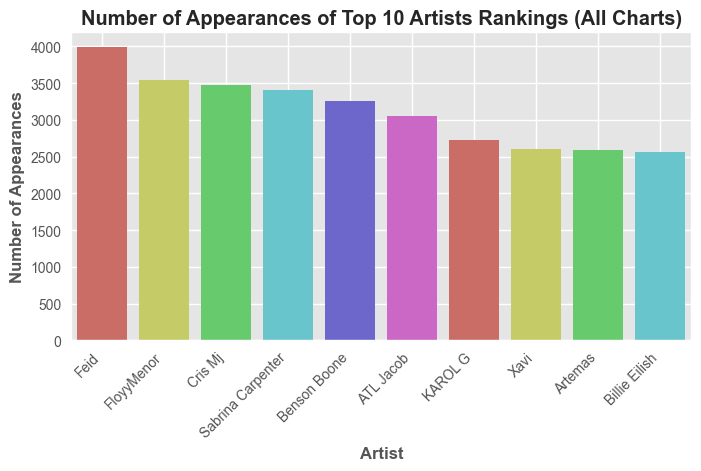

In [291]:
# Filter top 10 ranking songs
top_ranked_songs = df[df['daily_rank'] <= 10]

# Explode the 'artists' column as multiple artists can appear in one song
top_ranked_songs['artists'] = top_ranked_songs['artists'].astype(str).apply(lambda x: x.split(','))
top_ranked_songs_exploded = top_ranked_songs.explode('artists')

# Count artist appearances
artist_appearances = top_ranked_songs_exploded['artists'].value_counts()

# Get top 10 most common artists
top_artists = artist_appearances.head(10)

# Plotting
plt.figure(figsize=(8, 4))
sns.barplot(x = top_artists.index, y = top_artists.values, palette = sns.color_palette('hls'))
plt.xticks(rotation = 45, ha = 'right')
plt.xlabel('Artist', fontweight='bold')
plt.ylabel('Number of Appearances', fontweight='bold')
plt.title('Number of Appearances of Top 10 Artists Rankings (All Charts)', fontweight='bold')
plt.grid(True)
plt.show()

Interestingly, as someone who lives in Australia, some of these artists I do not recognise! This is a given as this has aggregated the most frequent appearances by artists in 70 countries. There is bound to be artists which are more prevalent in other parts of the world. Let's take the most listened to artist in 2024, Feid, and see where people are listening to him.

##### Which countries are listening to the most charted artist in 2024 so far on Spotify, Feid?

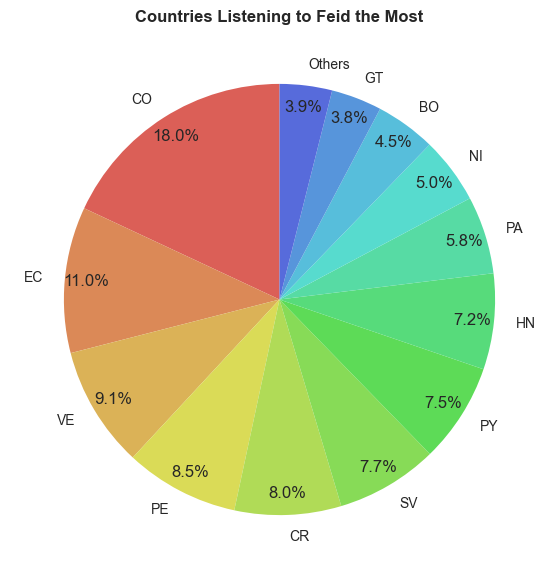

Percentages of countries in "Others"
ES: 1.20%
CL: 0.62%
UY: 0.56%
AR: 0.49%
DO: 0.39%
MX: 0.38%
Global: 0.29%


In [18]:
# Get top artist
top_artist = artist_appearances.idxmax()

# Filter for only the top artist
top_artist_data = df[df['artists'] == top_artist]

# Count appearances in each country
country_counts = top_artist_data['country'].value_counts()

# Group lesser percentages into an 'Others' category
threshold = 0.03 * country_counts.sum() # 3% threshold for lesser percentages
country_counts_filtered = country_counts[country_counts > threshold]
others_count = country_counts[country_counts <= threshold].sum()
if others_count > 0:
    country_counts_filtered['Others'] = others_count

# Plot in pie chart
plt.figure(figsize=(10, 7))
plt.pie(country_counts_filtered, labels = country_counts_filtered.index, autopct='%1.1f%%', startangle= 90, 
        pctdistance = 0.9, colors = sns.color_palette('hls', len(country_counts)))
plt.title(f'Countries Listening to {top_artist} the Most', fontweight='bold')
plt.show()

# Show composition of whats in 'Others'
country_proportions = country_counts/len(top_artist_data)
countries_in_others = country_proportions[country_proportions <= 0.03]
print('Percentages of countries in "Others"')
for country, proportion in countries_in_others.items():
    print(f"{country}: {proportion * 100:.2f}%")

As the pie chart above reveals, although Feid is the artist with the most appearances on the Top 50 charts globally, the majority of the placements come from South America Spotify charts. Out of the 4000 times they placed on Spotify charts in 2024 so far, only 0.29% of these were on the Global Spotify Top 50 chart, revealing that their presence may not be that global currently.

#### What is the overall popularity of Feid's songs?

In [19]:
# Take the average of each song's popularity so far in 2024
top_artist_data.groupby('name')['popularity'].mean().sort_values(ascending = False)

name
Feliz Cumpleaños Ferxxo   84.7794
CHORRITO PA LAS ANIMAS    83.1780
Normal                    82.1436
SORRY 4 THAT MUCH         82.1400
LUCES DE TECNO            80.6471
ALAKRAN                   80.2015
Prohibidox                79.5316
Ferxxo 100                78.9677
Name: popularity, dtype: float64

The mean popularity for each of Feid's songs placed on Top 50 charts do not place higher than 85 on the popularity index.

#### What is the distribution of song popularity across different countries and the global chart?

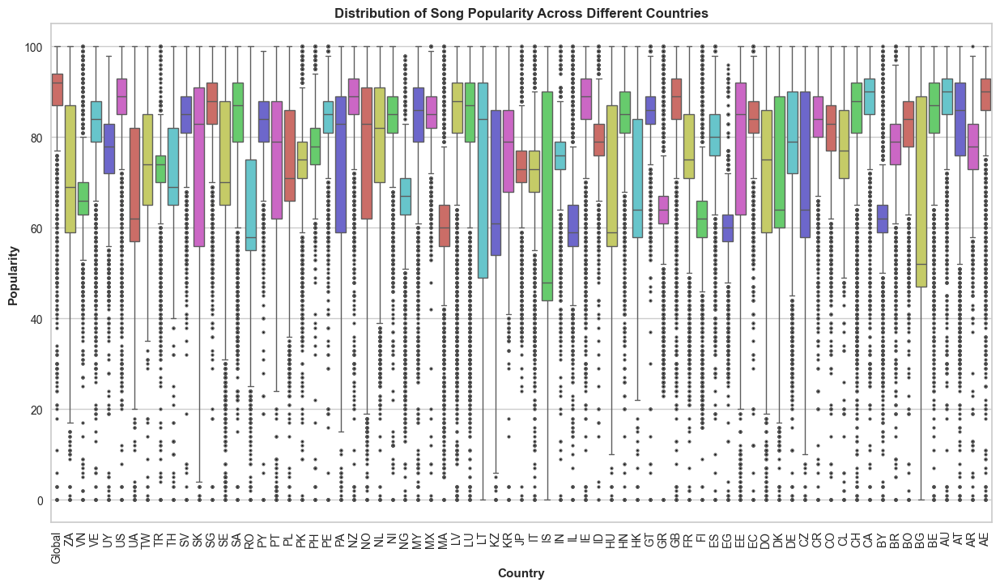

In [20]:
plt.figure(figsize=(15, 8))
sns.boxplot(x = 'country', y = 'popularity', data = df, palette = sns.color_palette('hls'), 
            flierprops = dict( markerfacecolor = 'black', markersize = 2))
plt.title('Distribution of Song Popularity Across Different Countries', fontweight='bold')
plt.xlabel('Country', fontweight='bold')
plt.ylabel('Popularity', fontweight='bold')
plt.xticks(rotation = 90)
plt.show()

This is an interesting indicator of the type of songs that are listened to across the globe. As expected for the global top 50 chart, the distribution of the popularity index sits around the 85 to 95 mark. Comparing this to other countries with the most spread in popularity such as Lithuania (LT), Iceland (IS), and Bulgaria (BG), having a spread amongst lower popularity scores could indicate that the most popular songs in those countries are not that popular globally on Spotify.

This coincides with the analysis above that while Feid is the artist with the most placements on the Spotify charts globally, because they are not listened to on a global scale, even their most popular songs would not be within the ranges of the popularity index on the Global chart.

#### Do the popularity of songs on the global chart fluctuate over time?

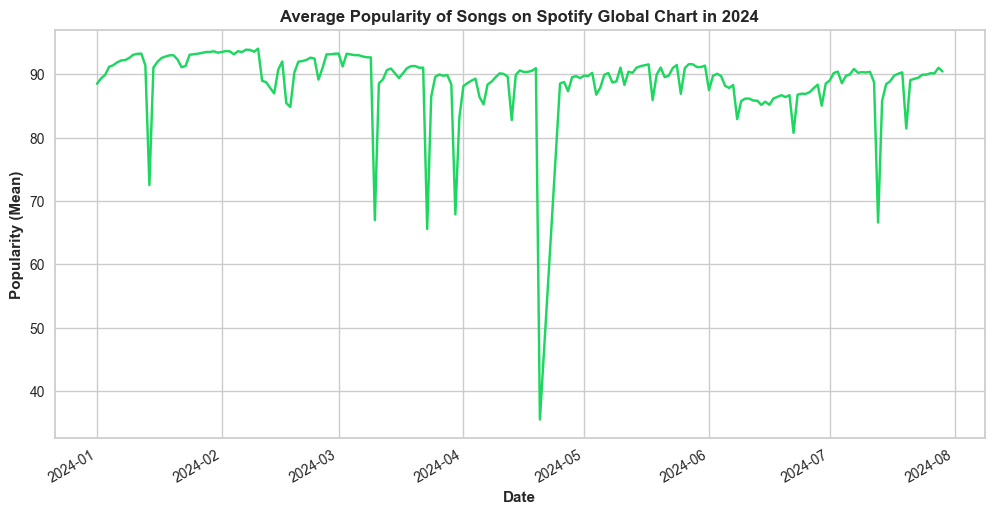

In [21]:
filtered_global = df[df['country'] == 'Global']
popularity_over_time = filtered_global.groupby('snapshot_date')['popularity'].mean()

# Plotting the chart
plt.figure(figsize = (12, 6))
popularity_over_time.plot(color = '#1ED760')
plt.title('Average Popularity of Songs on Spotify Global Chart in 2024', fontweight='bold')
plt.xlabel('Date', fontweight='bold')
plt.ylabel('Popularity (Mean)', fontweight='bold')
plt.show()

Coinciding with the box plot, this time series plot shows that the average popularity of songs on the Global Top 50 sits around the 85 to 95 popularity index. However, there are some points where the graph dips, even reaching as low as an average of 35 popularity. From Spotify's perspective this can be concerning if this is due to Spotify's recommendation algorithms and which songs are being promoted. Other reasons could be that fewer major artists released music during this time or a temporary shift in listener preferences.

##### Why was there a massive dip in popularity of the Global Top 50 in April 2024?

In [22]:
# Identify the period of the biggest dip
dip_start = '2024-04-15'
dip_end = '2024-04-20'

# Filter songs released during the dip period and with a popularity index less than 50
dip_songs = filtered_global[(filtered_global['snapshot_date'] >= dip_start) & (filtered_global['snapshot_date'] <= dip_end) 
& (filtered_global['popularity'] <= 50)]

# Display the songs
dip_songs[['name', 'artists', 'popularity']]

,name,artists,popularity
358700,Fortnight (feat. Post Malone),"Taylor Swift, Post Malone",0
358701,The Tortured Poets Department,Taylor Swift,0
358702,Down Bad,Taylor Swift,0
358703,"So Long, London",Taylor Swift,0
358704,My Boy Only Breaks His Favorite Toys,Taylor Swift,0
358705,But Daddy I Love Him,Taylor Swift,0
358706,Florida!!! (feat. Florence + The Machine),"Taylor Swift, Florence + The Machine",0
358707,I Can Do It With a Broken Heart,Taylor Swift,0
358708,Who’s Afraid of Little Old Me?,Taylor Swift,0
358709,Fresh Out The Slammer,Taylor Swift,0


Quite interestingly, the dip was due to Taylor Swift whose newest release charted within the Spotify Global Top 50 as soon as it was released. On its immediate release its popularity index had not yet been calculated which is why popularity is 0, however the entire album already ranked within the Global Top 50 due to the sheer number of listeners. On paper would seem contradictory since popularity and the Global Top 50 are linked, but the achievement is something only Taylor Swift can pull off!

## Step 5: Data preprocessing and additional exploration

- Deal with the data as required by the modelling technique
    - Duplicates (aggregate repeated tracks)
    - Distribution
    - Coded content
    - Feature engineering
    - Correlation analysis

### Duplicates

As previously noted, for the purposes of building a predictive model, song duplicates can skew the data and lead to biased predictions if songs chart more frequently than others. Aggregating the data based on calculating the rolling average popularity over a 7 day period and then taking this mean across all days and countries will mitigate this so the popularity index can be made the focus. Rolling average popularity is chosen so that we can assess a song's actual popularity over time i.e. no short term one hit wonders, with a focus on capturing recent trends. 

In [23]:
# Apply rolling average to popularity with a 7 day window
def rolling_aggregation(group, window = 7):
    group = group.set_index('snapshot_date')
    group['rolling_popularity'] = group['popularity'].rolling(window = window, min_periods =1 ).mean()
    return group.reset_index()

# Apply the rolling aggregation for each song
df_rolling = df.groupby(['spotify_id', 'name', 'artists']).apply(rolling_aggregation).reset_index(drop=True)

In [207]:
# Aggregate data for modelling, note that for the audio features whilst we are taking the max for each, they will remain
# the same as the actual audio metadata for each song should not change
# columns such as daily_rank, daily_movement, and weekly_movement will also be dropped
df_agg = df_rolling.groupby(['spotify_id', 'name', 'artists']).agg({
    'rolling_popularity': 'mean',
    'is_explicit': 'max', 
    'duration_sec': 'max',
    'album_release_date': 'max',
    'danceability': 'max',
    'energy': 'max',
    'key': 'max',
    'loudness': 'max',
    'mode': 'max', 
    'speechiness': 'max',
    'acousticness': 'max',
    'instrumentalness': 'max',
    'liveness': 'max',
    'valence': 'max',
    'tempo': 'max',
    'time_signature': 'max'
}).reset_index()

### Additional cleaning
Additional cleaning needed for modelling such as:
- Cleaning data types
- Dropping unneeded columns
- Dropping unneeded rows (Drop rows where popularity = 0 as through the analysis above, it shows tracks 
- Tidy up structure of DataFrame 

In [208]:
# Make spotify_id column as it is not needed anymore
df_agg = df_agg.drop(['spotify_id'], axis = 1)

In [209]:
# Move 'popularity' column to the end so that it can be viewed more easily in analysis
popularity = df_agg.pop('rolling_popularity')
df_agg.insert(len(df_agg.columns), 'popularity', popularity)

In [210]:
# Convert is_explicit to categorical
df_agg = pd.get_dummies(df_agg, columns = ['is_explicit'])

In [211]:
# Drop rows where popularity = 0. As was identified above, it is counterintuitive that songs with a popularity of 0 are 
# songs whose popularity index had not yet been registered due to upon its instant release it had already charted in the 
# Top 50. So these songs are inherently 'popular' and leaving these anomalies in will only skew the data
df_agg = df_agg[df_agg['popularity'] > 0]

In [212]:
# View new DataFrame with aggregated duplicates
df_agg

,name,artists,duration_sec,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,popularity,is_explicit_False,is_explicit_True
0,Mr. Brightside,The Killers,222.9730,2004-01-01,0.3520,0.9110,1,-5.2300,1,0.0747,0.0012,0.0000,0.0995,0.2360,148.0330,4,87.4646,True,False
1,En Solskinnsdag,Postgirobygget,186.4130,1996-01-01,0.7860,0.4360,10,-9.8020,1,0.0433,0.4110,0.0000,0.1070,0.7340,120.1000,4,56.9821,True,False
2,SMASH,BILLA JOE,137.2990,2024-02-16,0.7360,0.6680,10,-6.0130,0,0.1520,0.2710,0.0003,0.1890,0.4810,167.9850,4,34.0000,False,True
3,Bem Mais Que Eu (Você Quer Caçar Seu Rumo) - A...,Diego & Victor Hugo,177.7070,2024-04-25,0.4350,0.6350,0,-5.5480,1,0.0378,0.4080,0.0000,0.4530,0.3900,169.7040,3,55.0000,True,False
4,En sitä tarkoittanut,"Edicti, F",166.1530,2024-05-23,0.7670,0.4420,5,-7.7140,1,0.0379,0.7080,0.2450,0.1140,0.3360,130.0670,4,60.9221,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10696,Yang Tlah Merelakanmu,Seventeen,293.4800,2010-01-01,0.4460,0.6860,2,-3.9420,1,0.0267,0.0603,0.0000,0.0819,0.3830,143.9120,4,79.5860,True,False
10697,Hupsista,emma,133.7670,2024-02-09,0.9230,0.6630,4,-7.4020,1,0.1230,0.3040,0.0000,0.1090,0.9550,140.0320,4,57.7077,True,False
10698,Pa Mu,"Dardan, Azet",170.5000,2024-06-28,0.8060,0.7780,7,-7.3600,0,0.0547,0.2810,0.0000,0.1560,0.3590,104.0140,4,45.0759,True,False
10699,Hori Khele Raghuveera,"Amitabh Bachchan, Sukhwinder Singh, Alka Yagni...",339.5330,2003-08-23,0.5210,0.7950,6,-8.1190,1,0.4940,0.2750,0.0000,0.6690,0.5310,138.0490,4,56.0000,True,False


In [213]:
# Check information of new DataFrame
df_agg.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10324 entries, 0 to 10700
Data columns (total 19 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   name                10324 non-null  object        
 1   artists             10324 non-null  object        
 2   duration_sec        10324 non-null  float64       
 3   album_release_date  10324 non-null  datetime64[ns]
 4   danceability        10324 non-null  float64       
 5   energy              10324 non-null  float64       
 6   key                 10324 non-null  int64         
 7   loudness            10324 non-null  float64       
 8   mode                10324 non-null  int64         
 9   speechiness         10324 non-null  float64       
 10  acousticness        10324 non-null  float64       
 11  instrumentalness    10324 non-null  float64       
 12  liveness            10324 non-null  float64       
 13  valence             10324 non-null  float64       


### Distribution

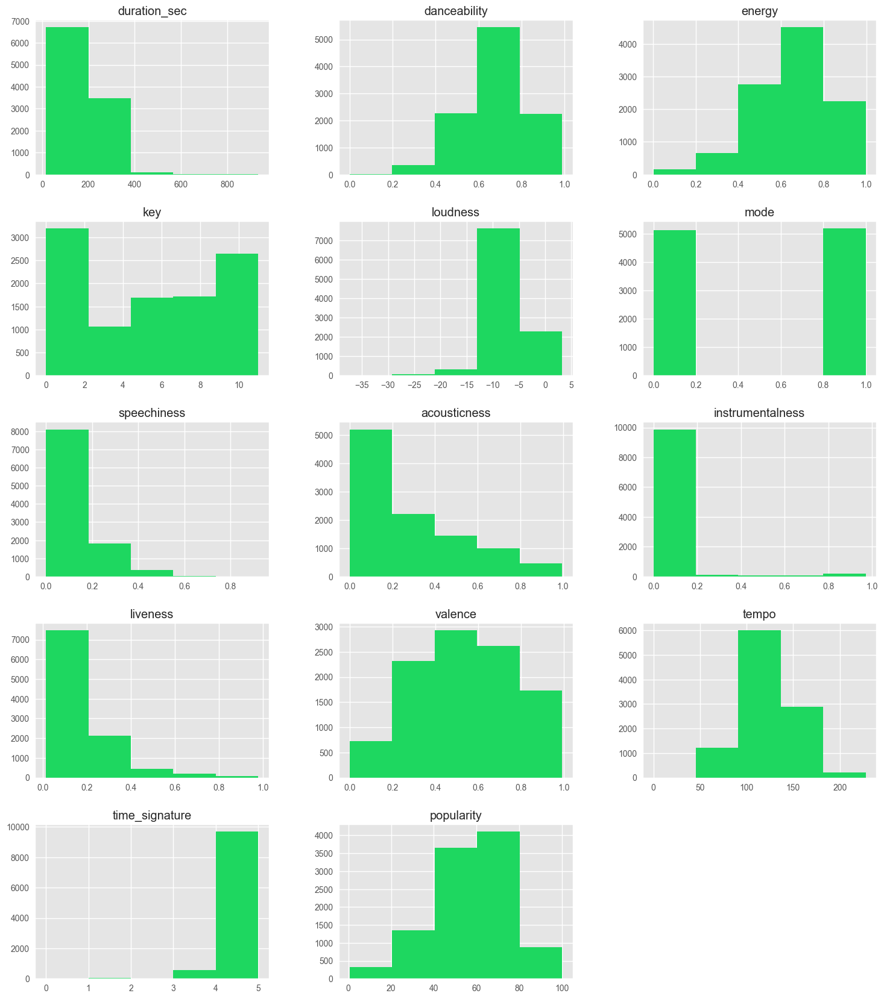

In [214]:
# Select numeric features
num_features = df_agg.select_dtypes(include='number').columns

# Check distribution of variables
df_agg[num_features].hist(bins = 5, figsize = (18, 25), layout = (6, 3), color = '#1ED760')
plt.show()

Some key takeaways from distribution:
- Songs tend to lean with high danceability, loudness and high energy
- There is quite an even split between songs with major and minor key modes
- Songs on the top 50 have less speechiness, acousticness and liveness
- Valence has quite a slightly negatively skewed distribution, indicating that popular songs lean more slightly happy
- Our target variable popularity leans negatively skewed

### Outliers

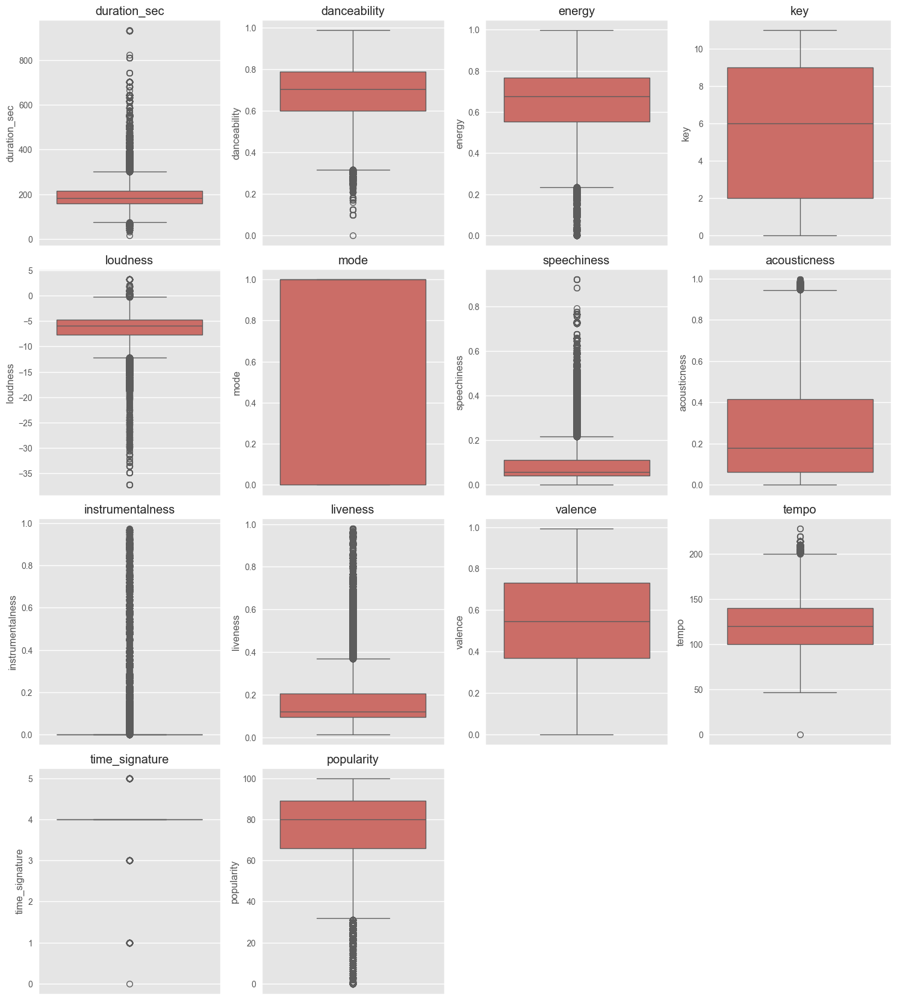

In [215]:
# Use boxplots to check for outliers
plt.figure(figsize = (15, 25))
for i, col in enumerate (num_features, 1):
    plt.subplot(6, 4, i)
    sns.boxplot(y = df[col], palette = sns.color_palette('hls'))
    plt.title(col)
plt.tight_layout()
plt.show()

As can be seen, some variables are highly skewed, even though they are not errors and represent the true variability of the data. Even so, to make them more representative of the population and ensure more accuracy and reliability of the modelling the outliers will be dealt with.

In [216]:
# For features with moderate to high skewness we will be using a box-cox transformation to make the data as
# close to normally distributed as possible
# the target variable will also be transformed to help with non-linear relationships with predictors
# because these outliers form a significant part of the data and there is a lot of them we should retain the
# information but stabilise the variances
df_agg['duration_sec_bc'], _ = stats.boxcox(df_agg['duration_sec'] + 1)
df_agg['speechiness_bc'], _ = stats.boxcox(df_agg['speechiness'] + 1)
df_agg['instrumentalness_bc'], _ = stats.boxcox(df_agg['instrumentalness'] +1)
df_agg['liveness_bc'], _ = stats.boxcox(df_agg['liveness'] +1)
df_agg['popularity_bc'], _ = stats.boxcox(df_agg['popularity'] + 1)
df_agg['danceability_bc'], _ = stats.boxcox(df_agg['danceability'] + 1)
df_agg['energy_bc'], _ = stats.boxcox(df_agg['energy'] + 1)
df_agg['acousticness_bc'], _ = stats.boxcox(df_agg['acousticness'] + 1)
df_agg['tempo_bc'], _ = stats.boxcox(df_agg['tempo'] + 1)

# Because of negative values in loudness this will need to be shifted to be all positive first
df_agg['loudness_shifted'] = df_agg['loudness'] - df_agg['loudness'].min() + 1
df_agg['loudness_bc'], _ = stats.boxcox(df_agg['loudness_shifted'] + 1)

# Drop loudness_shifted feature
df_agg = df_agg.drop(['loudness_shifted'], axis = 1)

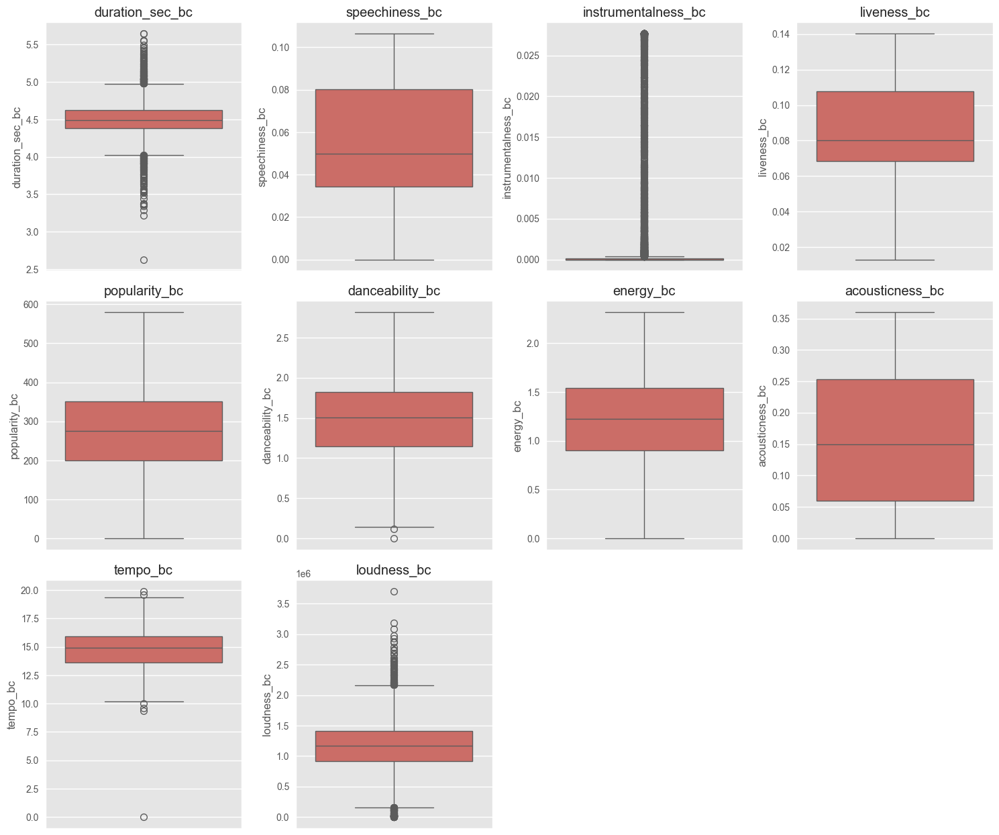

In [217]:
# Check transformed features with boxplots again
transformed_features = df_agg.select_dtypes(include='number').columns.drop(num_features)
plt.figure(figsize = (15, 25))
for i, col in enumerate (transformed_features, 1):
    plt.subplot(6, 4, i)
    sns.boxplot(y = df_agg[col], palette = sns.color_palette('hls'))
    plt.title(col)
plt.tight_layout()
plt.show()

In [218]:
# The features are now resembling a normal distribution
# With the remaining outliers we will use the z-score method to remove outliers beyond 3 standard deviations away
# from the mean
z_scores = stats.zscore(df_agg[['duration_sec_bc', 'danceability_bc', 'tempo_bc', 'loudness_bc', 'instrumentalness_bc']])
mask = (abs(z_scores) < 3).all(axis=1)
print("Dimensions before applying mask:", df_agg.shape)
df_agg_filtered = df_agg[mask]
print("Dimensions after applying mask:", df_agg_filtered.shape)

Dimensions before applying mask: (10324, 29)
Dimensions after applying mask: (9529, 29)


In [219]:
# For the heavily skewed instrumentalness_bc feature we will try winsorization to limit the extreme values by 
# transforming the outliers to their nearest value
# 20% is chosen due to heavy skewness and many outliers
df_agg_filtered['instrumentalness_bc'] = stats.mstats.winsorize(df_agg_filtered['instrumentalness_bc'], limits=[0.2, 0.2])

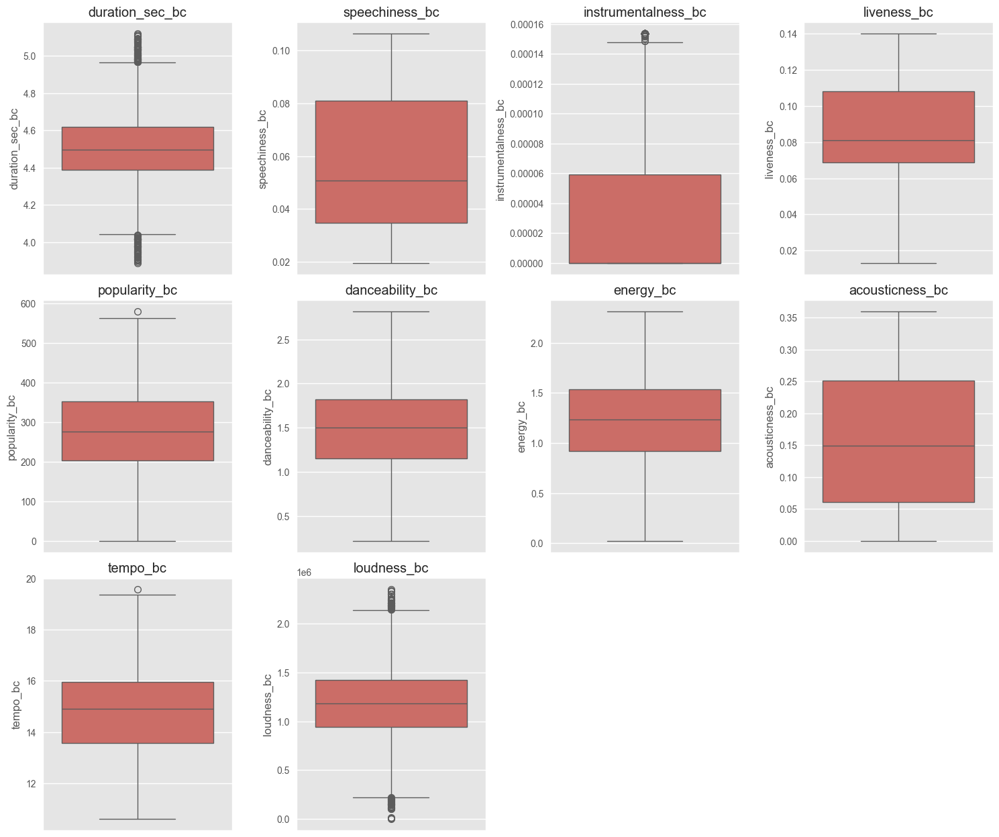

In [220]:
# check outliers one more time
plt.figure(figsize = (15, 25))
for i, col in enumerate (transformed_features, 1):
    plt.subplot(6, 4, i)
    sns.boxplot(y = df_agg_filtered[col], palette = sns.color_palette('hls'))
    plt.title(col)
plt.tight_layout()
plt.show()

The outliers and skewness has now been dealt with. Initially we transformed outliers to retain the information but stabilise the variability in the data. Remaining outliers outside 3 standard deviations away fom the mean were removed the improve the analysis and be more representative of the population.

### Visualisation

In [221]:
# Drop original feature columns in new DataFrame and retain the features with amended features
df_new = df_agg_filtered.drop(['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'tempo', 'duration_sec', 'popularity'], axis = 1)

In [289]:
df_new.describe()

,album_release_date,valence,duration_sec_bc,speechiness_bc,instrumentalness_bc,liveness_bc,danceability_bc,energy_bc,acousticness_bc,tempo_bc,...,valence_energy,acoustic_instrumental,speechiness_danceability,day_of_week,release_year,release_month,release_day,cum_artist_popularity,mean_artist_popularity,popularity_bc
count,9527,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,...,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000,9527.0000
mean,2021-10-17 05:41:35.853888768,0.5473,4.5047,0.0574,0.0000,0.0871,1.4930,1.2313,0.1580,14.8802,...,0.7087,0.0000,0.0886,3.1983,2021.3878,5.4075,15.5400,449.0613,273.7782,273.7782
min,1939-01-01 00:00:00,0.0334,3.8889,0.0196,0.0000,0.0132,0.2218,0.0248,0.0000,10.6206,...,0.0052,0.0000,0.0075,0.0000,1939.0000,1.0000,1.0000,0.0000,0.6894,0.6894
25%,2023-04-28 00:00:00,0.3720,4.3881,0.0347,0.0000,0.0686,1.1556,0.9201,0.0611,13.5854,...,0.3680,0.0000,0.0462,3.0000,2023.0000,3.0000,8.0000,0.0000,205.4317,203.8851
50%,2024-01-24 00:00:00,0.5450,4.4974,0.0507,0.0000,0.0811,1.5046,1.2322,0.1497,14.9244,...,0.6468,0.0000,0.0768,4.0000,2024.0000,5.0000,15.0000,0.0000,275.5868,276.9676
75%,2024-04-19 00:00:00,0.7230,4.6199,0.0810,0.0001,0.1084,1.8223,1.5381,0.2518,15.9449,...,0.9908,0.0000,0.1233,4.0000,2024.0000,7.0000,24.0000,369.9419,349.6392,353.0124
max,2024-07-26 00:00:00,0.9920,5.1208,0.1064,0.0002,0.1402,2.8152,2.3114,0.3598,19.5675,...,2.2069,0.0001,0.2718,6.0000,2024.0000,12.0000,31.0000,27536.1402,562.5206,579.2187
std,NaN,0.2250,0.1792,0.0255,0.0001,0.0256,0.4662,0.4309,0.1059,1.5833,...,0.4304,0.0000,0.0524,1.3749,7.0088,3.3523,9.0471,1601.8768,100.6064,108.3428


In [222]:
# Move 'popularity_bc' column to the end so that it can be viewed more easily in analysis
popularity = df_new.pop('popularity_bc')
df_new.insert(len(df_new.columns), 'popularity_bc', popularity)

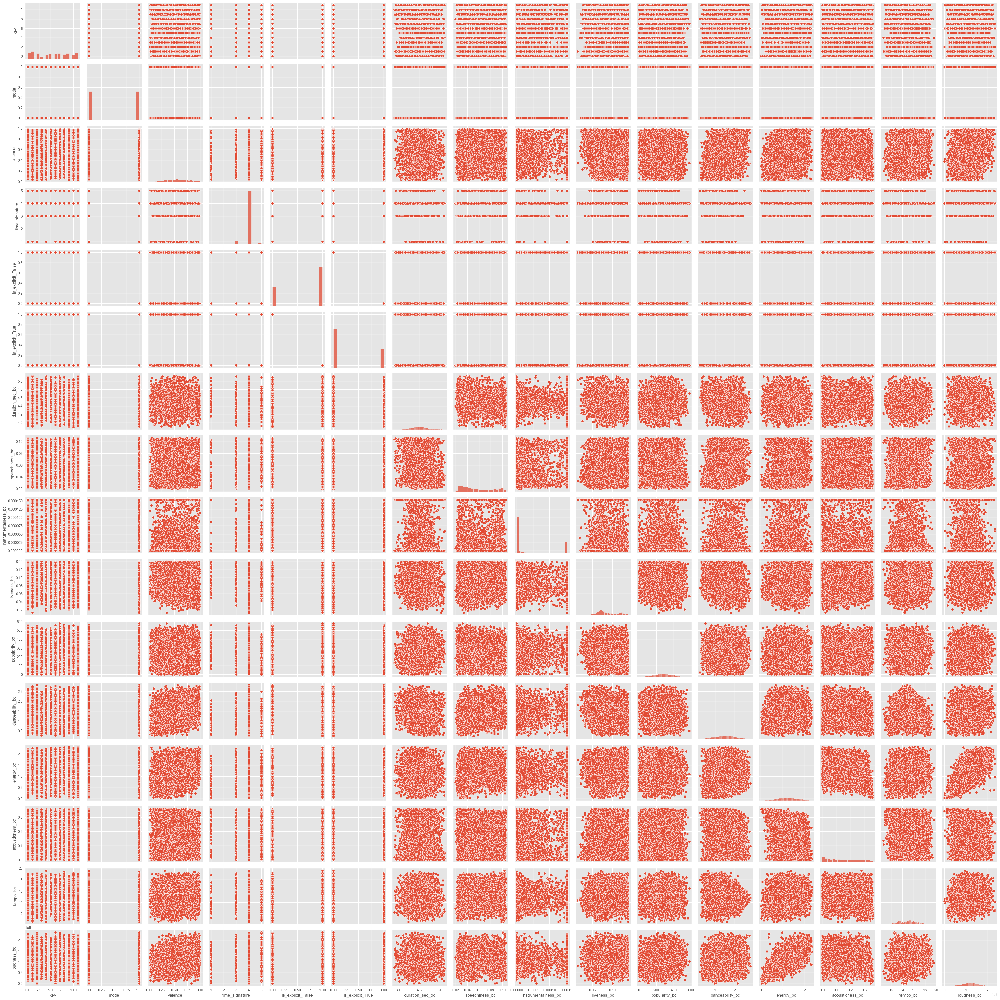

In [164]:
# Visualise the data points with pairplot
sns.pairplot(df_new)
plt.show()

The visualisation for the pairplot is looking a bit cramped so let's look at some specific relationships with popularity.

In [171]:
def relationship(df, feature, color):
    '''
    Inputs:
    df: Dataset
    feature: Name of Feature to Check With Popularity
    '''

     # Scatter plot for numeric features
    plt.figure(figsize=(7, 4))
    sns.scatterplot(x = 'popularity_bc', y = feature, data = df_new, color = color)
    plt.title(f'Relationship between popularity and {feature}', fontweight='bold')
    plt.xlabel('popularity_bc', fontweight='bold')
    plt.ylabel(feature, fontweight='bold')
    plt.show()

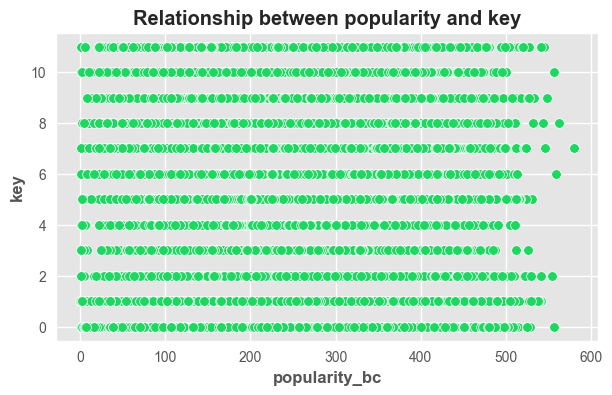

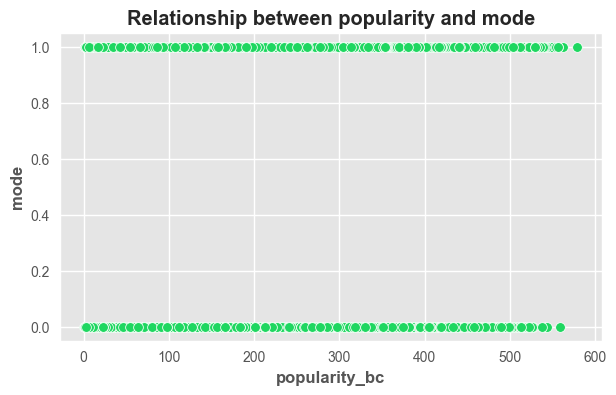

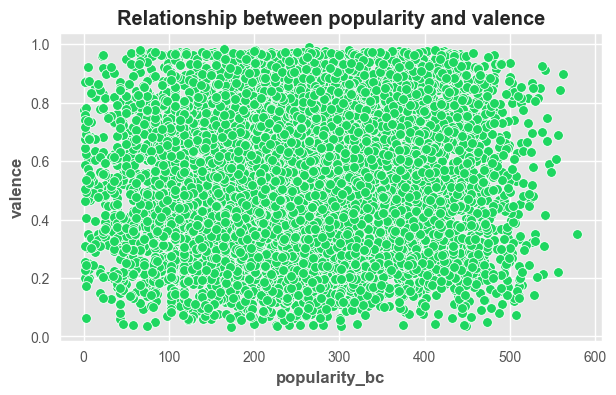

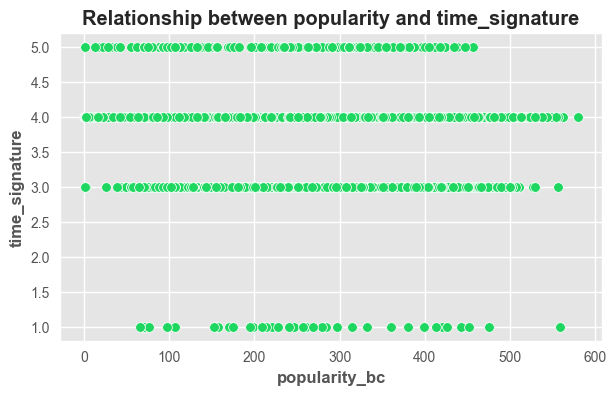

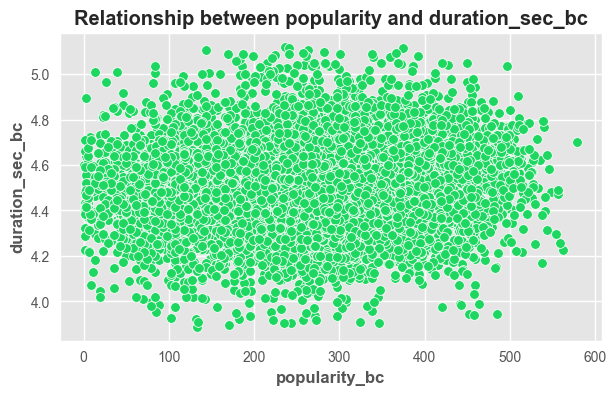

...

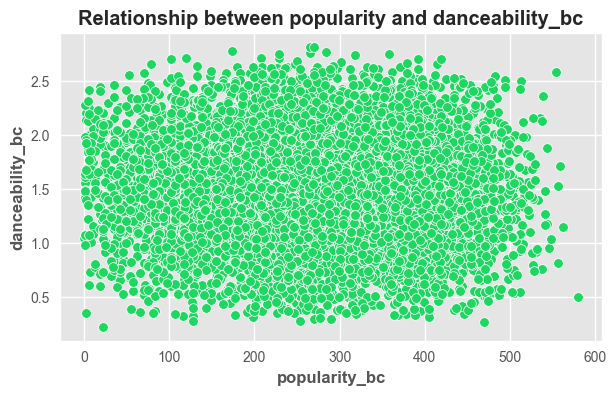

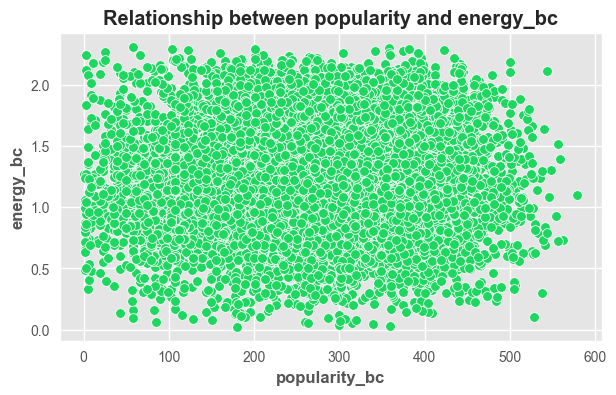

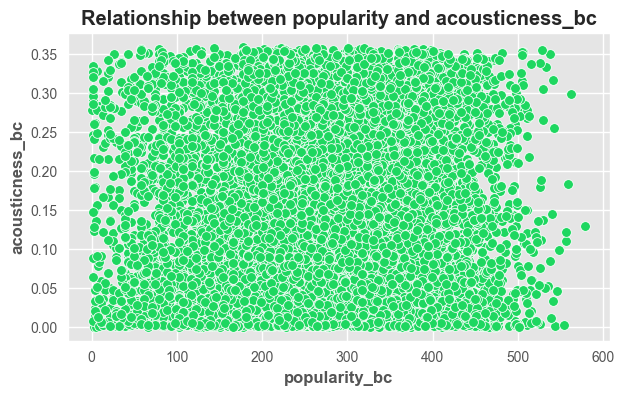

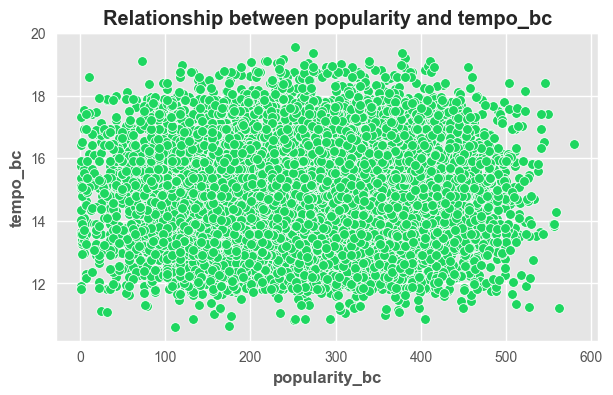

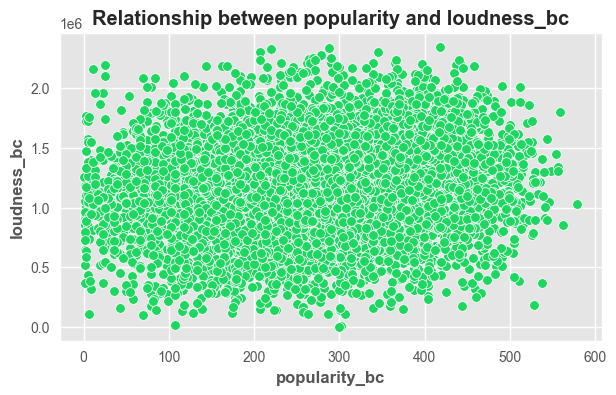

In [173]:
numeric = df_new.select_dtypes(include='number').columns

for feature in numeric:
    if feature != 'popularity_bc':
        relationship(df_new, feature, color = '#1ED760')

### Correlation analysis

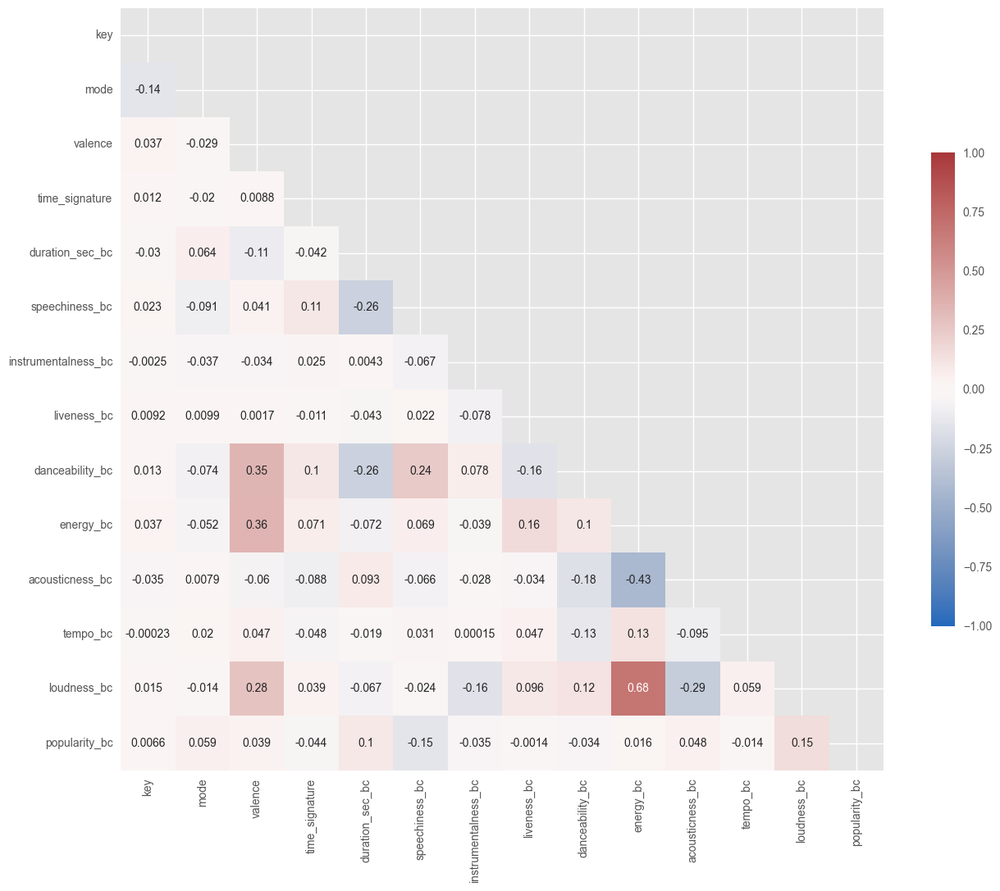

In [183]:
# Prepare correlation matrix heatmap to see relationships between variables
corr_matrix = df_new.select_dtypes(include='number').corr()
plt.figure(figsize = (15, 15))
sns.heatmap(corr_matrix, annot=True, mask = np.triu(np.ones_like(corr_matrix, dtype=bool)), cmap = 'vlag', 
            vmax = 1, vmin = -1, cbar_kws={"shrink": .5}, square = True)
plt.show()

Through the correlation analysis and scatter plots of the relationship between popularity and the dependent variables, we can see that there is no clear linear relationship between any of the variables and popularity. A popular track has many various attributes and can differ from one another. We may need to focus on non-linear models and feature engineer to be able to uncover a usable model.

### Feature Engineering
To capture synergies not seen by the features alone, we will look at creating some new features based on the variables.

#### Interaction features

Selecting features which have a high correlation with each other to synergise may reveal a deeper pattern in relationships, as some genres may have more prevalent features. A song that is high in two features might be more popular than a song only high in one feature.

In [223]:
# Energy and danceability together may reveal the vibe of a song
df_new['energy_danceability'] = df_new['energy_bc'] * df_new['danceability_bc']

# Loudness and tempo could correlate in certain genres
df_new['loudness_tempo'] = df_new['loudness_bc'] * df_new['tempo_bc']

# Valence and energy - tracks which are more happy and energetic could be more appealing
df_new['valence_energy'] = df_new['valence'] * df_new['energy_bc']

# Acousticness and instrumentalness - songs high in these categories will give a unique appeal
df_new['acoustic_instrumental'] = df_new['acousticness_bc'] * df_new['instrumentalness_bc']

# Danceability and speechiness - those less on the index could be more edm style
df_new['speechiness_danceability'] = df_new['speechiness_bc'] * df_new['danceability_bc']

#### Categorical features

As previously mentioned, musical keys are currently being denoted by integers, however it does not reveal its actual key. We will map the key to musical notes and then combine key and mode to show the overall specific musical tone of each song, which is actually called the key.

Additionally, we will categorise song duration, valence, and tempo into categories so the model can handle these non-linearally. 

In [224]:
# Map keys to musical pitch
key_map = {
    0: 'C', 1: 'C#/Db', 2: 'D', 3: 'D#/Eb', 4: 'E', 5: 'F',
    6: 'F#/Gb', 7: 'G', 8: 'G#/Ab', 9: 'A', 10: 'A#/Bb', 11: 'B'}
df_new['key_note'] = df_new['key'].map(key_map)

# Map mode to major/minor
mode_map = {0: 'min', 1: 'maj'}
df_new['mode_type'] = df_new['mode'].map(mode_map)

# Create combined feature
df_new['song_key'] = df_new['key_note'] + '_' + df_new['mode_type']

# Drop key_note and mode_type columns
df_new = df_new.drop(['key_note', 'mode_type', 'key', 'mode'], axis = 1)

In [225]:
# Categorise song duration into categories based on standard deviation
mean_duration = df_new['duration_sec_bc'].mean()
std_dev_duration = df_new['duration_sec_bc'].std()

bins = [
    df_new['duration_sec_bc'].min(),                          # Minimum value
    mean_duration - std_dev_duration,                      # Lower bound for bin 1
    mean_duration + std_dev_duration,                      # Upper bound for bin 2
    df_new['duration_sec_bc'].max()                           # Maximum value
]

labels = ['short', 'normal', 'long']
df_new['duration_category'] = pd.cut(df_new['duration_sec_bc'], bins = bins, labels = labels)

In [226]:
# Categorise valence into categories based on standard deviation
mean_duration = df_new['valence'].mean()
std_dev_duration = df_new['valence'].std()

bins = [
    df_new['valence'].min(),                            # Minimum value
    mean_duration - std_dev_duration,                      # Lower bound for bin 1
    mean_duration + std_dev_duration,                      # Upper bound for bin 2
    df_new['valence'].max()                             # Maximum value
]

labels = ['sad', 'neutral', 'happy']
df_new['valence_category'] = pd.cut(df_new['valence'], bins = bins, labels = labels)

In [227]:
# Categorise tempo into categories based on standard deviation
mean_duration = df_new['tempo_bc'].mean()
std_dev_duration = df_new['tempo_bc'].std()

bins = [
    df_new['tempo_bc'].min(),                            # Minimum value
    mean_duration - std_dev_duration,                      # Lower bound for bin 1
    mean_duration + std_dev_duration,                      # Upper bound for bin 2
    df_new['tempo_bc'].max()                             # Maximum value
]

labels = ['slow', 'normal', 'fast']
df_new['tempo_category'] = pd.cut(df_new['tempo_bc'], bins = bins, labels = labels)

#### Temporal features

In [228]:
# Extract temporal information from release date, as the day/month/year it is released could impact popularity
df_new['day_of_week'] = df_new['album_release_date'].dt.dayofweek
df_new['release_year'] = df_new['album_release_date'].dt.year
df_new['release_month'] = df_new['album_release_date'].dt.month
df_new['release_day'] = df_new['album_release_date'].dt.day

#### Aggregated metrics

In [229]:
# Create a column for cumulative artist popularity to see if their overall popularity has an impact on the song's
# popularity
# Sort by album_release_date
df_new = df_new.sort_values(by = 'album_release_date')

# calculate cumulative and mean popularity for each artist
df_new['cum_artist_popularity'] = df_new.groupby('artists')['popularity_bc'].cumsum() - df_new['popularity_bc']
df_new['mean_artist_popularity'] = df_new.groupby('artists')['popularity_bc'].transform('mean')

#### Encode categorical features

In [230]:
# Use get dummies for categorical variables
# time_signature to be treated as a category
df_new = pd.get_dummies(df_new, 
                        columns = ['duration_category', 'song_key', 'time_signature', 'valence_category', 'tempo_category'], 
                        drop_first = True)

In [234]:
# Move 'popularity_bc' column to the end so that it can be viewed more easily in analysis
popularity = df_new.pop('popularity_bc')
df_new.insert(len(df_new.columns), 'popularity_bc', popularity)

In [235]:
# Check data and info once again before we start modelling
df_new

,name,artists,album_release_date,valence,is_explicit_False,is_explicit_True,duration_sec_bc,speechiness_bc,instrumentalness_bc,liveness_bc,...,song_key_G_maj,song_key_G_min,time_signature_3,time_signature_4,time_signature_5,valence_category_neutral,valence_category_happy,tempo_category_normal,tempo_category_fast,popularity_bc
8511,No Love,"lusttqwe, jesp, bexter",1900-01-01,0.7070,True,False,4.4427,0.0337,0.0000,0.1036,...,False,False,False,True,False,True,False,True,False,61.4397
6519,Ya Leilet El Eid,Umm Kulthum,1939-01-01,0.4510,True,False,4.8498,0.0422,0.0001,0.1395,...,False,False,False,True,False,True,False,True,False,127.8088
10591,Jingle Bell Rock,Bobby Helms,1957-12-02,0.8060,True,False,4.2531,0.0303,0.0000,0.0509,...,False,False,False,True,False,False,True,True,False,529.5902
3999,Let It Snow! Let It Snow! Let It Snow!,Dean Martin,1959-01-01,0.7010,True,False,4.1694,0.0295,0.0000,0.0962,...,False,False,False,True,False,True,False,True,False,537.7640
5492,Piano Merengue,Damiron,1962-12-10,0.8550,True,False,4.4424,0.0397,0.0002,0.0632,...,True,False,False,True,False,False,True,True,False,107.4977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5612,LeanTro,"yungest Moonstar, thasup",2024-07-26,0.5530,False,True,4.2289,0.0412,0.0002,0.0683,...,False,False,False,True,False,True,False,False,True,261.5587
9246,SUV,"DESH, Young Fly",2024-07-26,0.7000,True,False,4.1182,0.0581,0.0000,0.0581,...,False,False,False,True,False,True,False,True,False,176.3650
7279,gReeN,"yungest Moonstar, thasup",2024-07-26,0.3740,False,True,4.2921,0.0814,0.0000,0.0791,...,False,False,False,True,False,True,False,True,False,143.7469
3097,feRRa,Gleb,2024-07-26,0.3790,True,False,4.3641,0.0673,0.0000,0.0967,...,False,False,False,True,False,True,False,True,False,147.0649


In [239]:
# We can see in the ordered dataframe that the first row has an invalid release date so we will drop that row
df_new = df_new.drop(df_new.index[0])

In [233]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9529 entries, 8511 to 4578
Data columns (total 59 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   name                      9529 non-null   object        
 1   artists                   9529 non-null   object        
 2   album_release_date        9529 non-null   datetime64[ns]
 3   valence                   9529 non-null   float64       
 4   is_explicit_False         9529 non-null   bool          
 5   is_explicit_True          9529 non-null   bool          
 6   duration_sec_bc           9529 non-null   float64       
 7   speechiness_bc            9529 non-null   float64       
 8   instrumentalness_bc       9529 non-null   float64       
 9   liveness_bc               9529 non-null   float64       
 10  danceability_bc           9529 non-null   float64       
 11  energy_bc                 9529 non-null   float64       
 12  acousticness_bc       

We can see that that's a lot of dimensions being dealt with! To reduce this we will look at feature selection based on feature importance or dimensionality reduction through PCA.

### Identify inputs and output
For our main question the input variables will be the audio features specific, the output label will be popularity. This is a float number and because it is a known label we are dealing with **supervised regression** modelling. As above because we could not identify linear relationships through the correlation analysis, most likely we will need to implement nonlinear models.

It is also hypothesised that artist popularity will impact song popularity the most. Because of this, we will  implement two sets for feature selection; one with popularity metrics we've aggregated and one without.

In [292]:
# Input features will be all variables except for popularity which is our target, and any non-numeric features
# such as name and artist as they are not needed for modelling
X = df_new.drop(['name', 'artists', 'album_release_date', 'popularity_bc', 'mean_artist_popularity', 'cum_artist_popularity'], axis = 1)

# Output label will be popularity, which is the Spotify popularity index based on streams and recency
y = df_new['popularity_bc']

In [293]:
# Z dataset will include our features that have artist popularity
Z = df_new.drop(['name', 'artists', 'album_release_date', 'popularity_bc'], axis = 1)

# Output label will be popularity, which will remain the same
y = df_new['popularity_bc']

### Standardisation
Will scale features so that they have a mean of 0 and a standard deviation of 1, allowing all features to operate on the same scale, which is necessary as the current ranges of features currrently vary.

In [294]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
Z_scaled = scaler.fit_transform(Z)

## Step 6: Use PyCaret to establish a baseline
This will allow comparison of different models as a starting point for analysis and modelling. Using feature_selection = True allows feature selection to be performed and a subset of features will be selected based on importance scores. This will guide us in choosing an appropriate amount of features in feature selection. The top 3 models will be chosen for hyperparameter tuning.

In [348]:
# Combine X and y sets into the same DataFrame for Pycaret analysis, remembering that we are testing two scenarios: 
# one with artist popularity and one without
# no artist popularity
df1 = pd.concat([X, y], axis = 1)

# with artist popularity
df2 = pd.concat([Z, y], axis = 1)

In [390]:
# Initialise pycaret with data without artist popularity
# Experiment with different n_features to select to see impact of feature selection
# Normalize = True is the inbuilt standardisation feature as we have used unstandardised dataframes for Pycaret
s1 = setup(data = df1, target = 'popularity_bc', session_id = 0, fold_shuffle = True, normalize = True, 
           feature_selection = False)

,Description,Value
0,Session id,0
1,Target,popularity_bc
2,Target type,Regression
3,Original data shape,"(9527, 54)"
4,Transformed data shape,"(9527, 54)"
5,Transformed train set shape,"(6668, 54)"
6,Transformed test set shape,"(2859, 54)"
7,Numeric features,19
8,Preprocess,True
9,Imputation type,simple


In [391]:
# Compare models for without artist popularity
top3 = compare_models(n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,78.0872,9637.5314,98.0811,0.1762,0.5818,1.1345,2.1540
lightgbm,Light Gradient Boosting Machine,78.6278,9712.6401,98.4649,0.1697,0.5840,1.1436,0.2010
rf,Random Forest Regressor,78.9243,9743.1662,98.6311,0.1668,0.5844,1.1467,1.2720
gbr,Gradient Boosting Regressor,79.6886,9796.5539,98.9105,0.1620,0.5861,1.1679,0.3480
et,Extra Trees Regressor,79.4346,9965.8514,99.7329,0.1480,0.5904,1.1499,0.7760
ada,AdaBoost Regressor,82.7471,10357.9748,101.7198,0.1136,0.5905,1.1775,0.1080
lasso,Lasso Regression,82.7866,10554.9931,102.6737,0.0970,0.5983,1.1903,0.0230
llar,Lasso Least Angle Regression,82.7866,10555.0059,102.6738,0.0970,0.5983,1.1903,0.0220
br,Bayesian Ridge,82.7292,10561.5076,102.7066,0.0964,0.5980,1.1878,0.0230
ridge,Ridge Regression,82.8148,10580.4833,102.7999,0.0948,0.5975,1.1820,0.0220


In [392]:
print(top3)

[<catboost.core.CatBoostRegressor object at 0x000001F4A1A9C750>, LGBMRegressor(n_jobs=-1, random_state=0), RandomForestRegressor(n_jobs=-1, random_state=0)]


After running through different n_features_to_select, WITHOUT including artist popularity the best ratio of features to select which maximise r2 is all of the features i.e. no feature selection used with an r2 of 0.1762. This can be difficult with the sheer number of features as it may lead to high training times and overfitting. We will try some other feature selection techniques to offset this.

Top 3 models which will be focused on for modelling WITHOUT artist popularity are:
- Catboost regressor
- Light gradient boosting machine
- Random Forest regressor

In [384]:
# Initialise pycaret with data WITH artist popularity
# Experiment with different n_features to select to see impact of feature selection
# Normalize = True is the inbuilt standardisation feature as we have used unstandardised dataframes for Pycaret
s2 = setup(data = df2, target = 'popularity_bc', session_id = 0, fold_shuffle = True, normalize = True, 
           feature_selection = True, n_features_to_select = 0.5)

,Description,Value
0,Session id,0
1,Target,popularity_bc
2,Target type,Regression
3,Original data shape,"(9527, 56)"
4,Transformed data shape,"(9527, 28)"
5,Transformed train set shape,"(6668, 28)"
6,Transformed test set shape,"(2859, 28)"
7,Numeric features,21
8,Preprocess,True
9,Imputation type,simple


In [385]:
# Compare models for WITH artist popularity
top3with = compare_models(n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,22.4804,1553.6863,39.3796,0.8668,0.2646,0.2396,0.5510
lasso,Lasso Regression,20.7257,1565.8697,39.5407,0.8657,0.2524,0.2134,0.6520
llar,Lasso Least Angle Regression,20.7257,1565.8697,39.5407,0.8657,0.2524,0.2134,0.1790
omp,Orthogonal Matching Pursuit,20.7301,1567.5412,39.5617,0.8656,0.2488,0.2065,0.1480
lr,Linear Regression,21.5481,1568.1497,39.5687,0.8655,0.2531,0.2172,0.9490
ridge,Ridge Regression,21.5466,1568.1264,39.5684,0.8655,0.2530,0.2172,0.3480
br,Bayesian Ridge,21.5426,1568.0673,39.5676,0.8655,0.2530,0.2171,0.1690
huber,Huber Regressor,19.9794,1575.1480,39.6589,0.8650,0.2489,0.2033,0.2940
lar,Least Angle Regression,21.7853,1574.8471,39.6536,0.8649,0.2553,0.2212,0.1570
lightgbm,Light Gradient Boosting Machine,23.1948,1591.7469,39.8482,0.8635,0.2626,0.2383,0.2500


In [387]:
print(top3with)

[GradientBoostingRegressor(random_state=0), Lasso(random_state=0), LassoLars(random_state=0)]


After running through different n_features_to_select, WITHOUT including artist popularity the best ratio of features to select which maximise r2 is 0.5 with an r2 of 0.8668. For feature selection we will first try reducing the number of features by half as indicated by the PyCaret.

As expected, including artist popularity has a significant impact on a song's popularity, which aligns with real world scenarios. This indicates that audio features play a secondary role compared to artist reputation. Regardless, its impact is not nil and we will still aim to uncover more nuanced insights about the role of audio features. 

Top 3 models which will be focused on for modelling WITH artist popularity are:
- Gradient boosting regressor
- Lasso regression
- Linear regression (3rd highest r2 score)

## Step 6: Feature Selection
- Identify inputs and output
- Standardise the data
- Use feature selection techniques to find the most relevant features:
  - Recursive feature elimination (RFE)
  - Lasso regression
- Use principal component analysis (PCA) to reduce dimensionality if needed

### PyCaret
Using PyCaret's inbuilt features to determine most important features.

In [393]:
# Using the best model determined earlier for the set WITHOUT artist popularity
cat = create_model('catboost', fold = 5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,75.7982,9166.8546,95.7437,0.1939,0.5683,1.1205
1,83.0148,10627.7449,103.0910,0.1316,0.6003,1.0617
2,80.4329,10351.2825,101.7413,0.1497,0.6107,1.1934
3,76.7068,9404.7196,96.9779,0.1719,0.5980,1.4680
4,76.6846,9114.6379,95.4706,0.1941,0.5449,0.8571
Mean,78.5274,9733.0479,98.6049,0.1682,0.5844,1.1401
Std,2.7541,631.4272,3.1818,0.0246,0.0243,0.1985


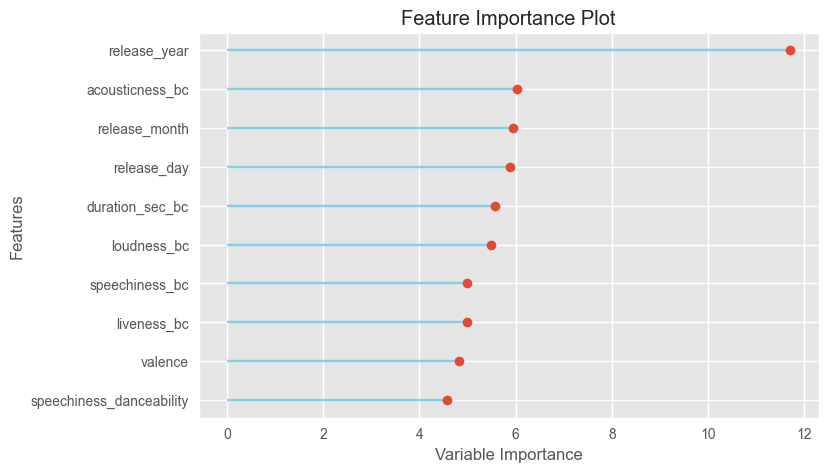

In [394]:
# Plot features
plot_model(cat, plot='feature')

Using Pycaret's built in feature importance and catboost regression, the most significant feature is the year a song is released, followed by other temporal and audio features.

In [388]:
# Using the best model determined earlier for the set WITHOUT artist popularity
gbr = create_model('gbr', fold = 5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,22.3119,1493.5077,38.6459,0.8687,0.2469,0.1676
1,22.1294,1456.2282,38.1606,0.8810,0.2224,0.1443
2,22.9799,1611.5550,40.1442,0.8676,0.2674,0.1875
3,22.2727,1566.8863,39.5839,0.8620,0.3093,0.3945
4,23.0507,1614.8153,40.1848,0.8572,0.2947,0.3028
Mean,22.5489,1548.5985,39.3439,0.8673,0.2681,0.2393
Std,0.3863,63.6394,0.8115,0.0080,0.0314,0.0948


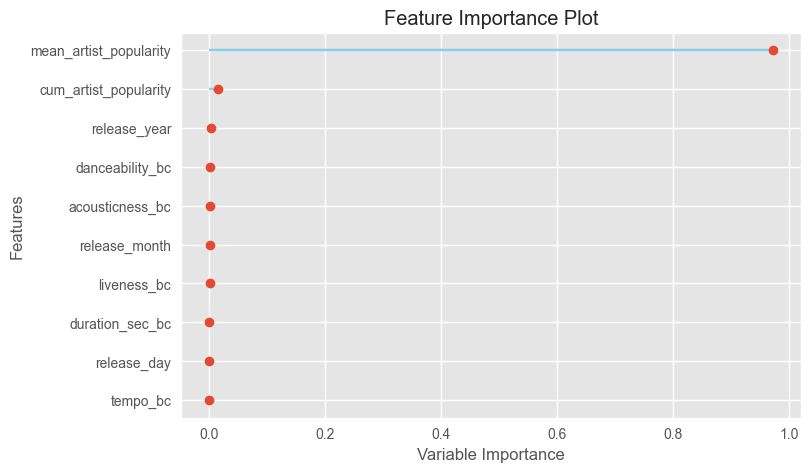

In [389]:
# Plot features
plot_model(gbr, plot='feature')

Reveals that by a large margin the mean artist popularity has the most significant impact on a song's popularity as previously hypothesised.

### Lasso regression
Adds a penalty shrinking the least important features to have zero coefficients, thus removed from the model.

#### Scenario with audio features only

In [399]:
# Initialize Lasso with cross-validation for the scenario without artist popularity
lasso_alphas = np.logspace(-6, 6, 200)
lasso1 = LassoCV(alphas = lasso_alphas, cv = 5, random_state=0)

# Fit Lasso model
lasso1.fit(X_scaled, y)

LassoCV(alphas=array([1.00000000e-06, 1.14895100e-06, 1.32008840e-06, 1.51671689e-06,
       1.74263339e-06, 2.00220037e-06, 2.30043012e-06, 2.64308149e-06,
       3.03677112e-06, 3.48910121e-06, 4.00880633e-06, 4.60592204e-06,
       5.29197874e-06, 6.08022426e-06, 6.98587975e-06, 8.02643352e-06,
       9.22197882e-06, 1.05956018e-05, 1.21738273e-05, 1.39871310e-05,
       1.60705282e-05, 1.84642494e-0...
       4.10265811e+04, 4.71375313e+04, 5.41587138e+04, 6.22257084e+04,
       7.14942899e+04, 8.21434358e+04, 9.43787828e+04, 1.08436597e+05,
       1.24588336e+05, 1.43145894e+05, 1.64467618e+05, 1.88965234e+05,
       2.17111795e+05, 2.49450814e+05, 2.86606762e+05, 3.29297126e+05,
       3.78346262e+05, 4.34701316e+05, 4.99450512e+05, 5.73844165e+05,
       6.59318827e+05, 7.57525026e+05, 8.70359136e+05, 1.00000000e+06]),
        cv=5, random_state=0)

Optimal Alpha: 1.414991297434576
Score: 0.10062504012705764


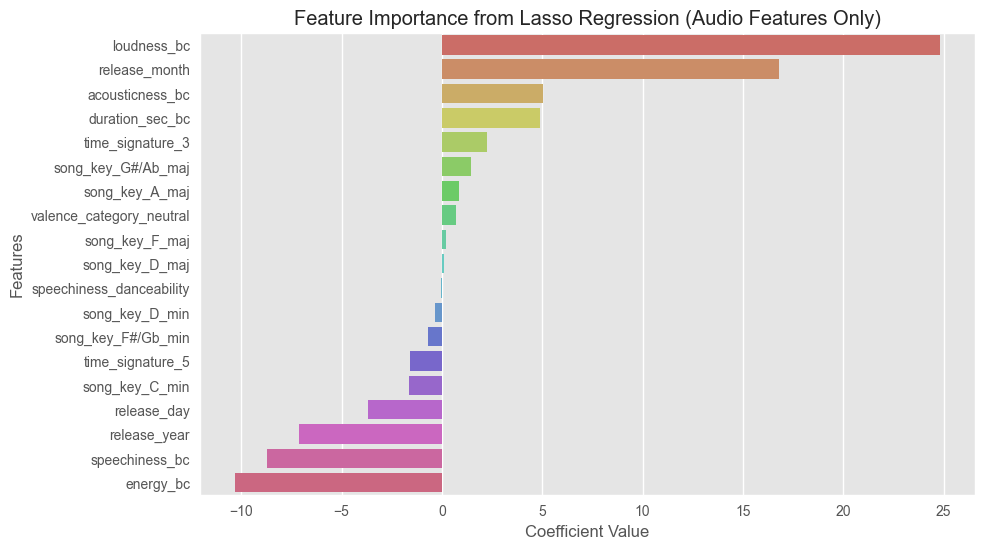

Selected Features by Lasso: ['duration_sec_bc', 'speechiness_bc', 'energy_bc', 'acousticness_bc', 'loudness_bc', 'speechiness_danceability', 'release_year', 'release_month', 'release_day', 'song_key_A_maj', 'song_key_C_min', 'song_key_D_maj', 'song_key_D_min', 'song_key_F#/Gb_min', 'song_key_F_maj', 'song_key_G#/Ab_maj', 'time_signature_3', 'time_signature_5', 'valence_category_neutral']


In [456]:
# Print the optimal alpha and model score
print('Optimal Alpha:', lasso1.alpha_)
print('Score:', lasso1.score(X_scaled, y))

# Prepare the data
lasso_coefficients1 = pd.Series(lasso1.coef_, index=X.columns)
important_features = lasso_coefficients1[lasso_coefficients1 != 0].sort_values(ascending = False)

# Convert to DataFrame for seaborn
feature_importance_df = pd.DataFrame({
    'Feature': important_features.index,
    'Coefficient Value': important_features.values
})

# Plot using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df, y='Feature', x='Coefficient Value', palette='hls')
plt.title("Feature Importance from Lasso Regression (Audio Features Only)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.show()

# Get selected features (non-zero coefficients)
selected_features_lasso1 = lasso_coefficients1[lasso_coefficients1 != 0].index.tolist()
print("Selected Features by Lasso:", selected_features_lasso1)

#### Scenario with all features (including artist popularity)

In [420]:
lasso2 = LassoCV(alphas = lasso_alphas, cv = 5, random_state=0)

# Fit Lasso model
lasso2.fit(Z_scaled, y)

LassoCV(alphas=array([1.00000000e-06, 1.14895100e-06, 1.32008840e-06, 1.51671689e-06,
       1.74263339e-06, 2.00220037e-06, 2.30043012e-06, 2.64308149e-06,
       3.03677112e-06, 3.48910121e-06, 4.00880633e-06, 4.60592204e-06,
       5.29197874e-06, 6.08022426e-06, 6.98587975e-06, 8.02643352e-06,
       9.22197882e-06, 1.05956018e-05, 1.21738273e-05, 1.39871310e-05,
       1.60705282e-05, 1.84642494e-0...
       4.10265811e+04, 4.71375313e+04, 5.41587138e+04, 6.22257084e+04,
       7.14942899e+04, 8.21434358e+04, 9.43787828e+04, 1.08436597e+05,
       1.24588336e+05, 1.43145894e+05, 1.64467618e+05, 1.88965234e+05,
       2.17111795e+05, 2.49450814e+05, 2.86606762e+05, 3.29297126e+05,
       3.78346262e+05, 4.34701316e+05, 4.99450512e+05, 5.73844165e+05,
       6.59318827e+05, 7.57525026e+05, 8.70359136e+05, 1.00000000e+06]),
        cv=5, random_state=0)

Optimal Alpha: 0.352970730273065
Score: 0.8650165297047963


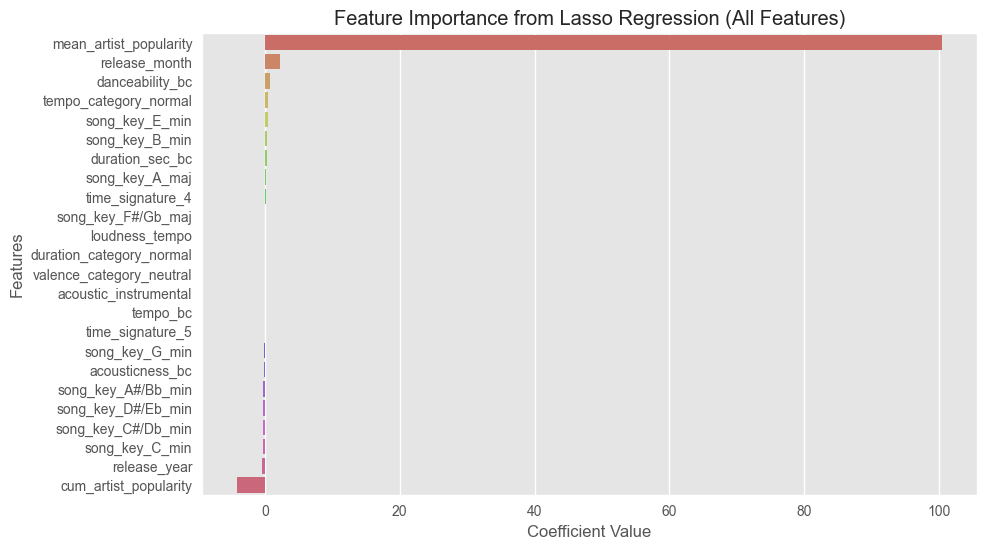

Selected Features by Lasso: ['duration_sec_bc', 'danceability_bc', 'acousticness_bc', 'tempo_bc', 'loudness_tempo', 'acoustic_instrumental', 'release_year', 'release_month', 'cum_artist_popularity', 'mean_artist_popularity', 'duration_category_normal', 'song_key_A#/Bb_min', 'song_key_A_maj', 'song_key_B_min', 'song_key_C#/Db_min', 'song_key_C_min', 'song_key_D#/Eb_min', 'song_key_E_min', 'song_key_F#/Gb_maj', 'song_key_G_min', 'time_signature_4', 'time_signature_5', 'valence_category_neutral', 'tempo_category_normal']


In [455]:
# Print the optimal alpha and model score
print('Optimal Alpha:', lasso2.alpha_)
print('Score:', lasso2.score(Z_scaled, y))

# Prepare the data
lasso_coefficients2 = pd.Series(lasso2.coef_, index=Z.columns)
important_features2 = lasso_coefficients2[lasso_coefficients2 != 0].sort_values(ascending = False)

# Convert to DataFrame for seaborn
feature_importance_df2 = pd.DataFrame({
    'Feature': important_features2.index,
    'Coefficient Value': important_features2.values
})

# Plot using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df2, y='Feature', x='Coefficient Value', palette='hls')
plt.title("Feature Importance from Lasso Regression (All Features)")
plt.xlabel("Coefficient Value")
plt.ylabel("Features")
plt.show()

# Get selected features (non-zero coefficients)
selected_features_lasso2 = lasso_coefficients2[lasso_coefficients2 != 0].index.tolist()
print("Selected Features by Lasso:", selected_features_lasso2)

### Recursive feature selection (RFE)
Removes the most significant features until the desired number of features are reached and features are ranked by importance. RandomForestRegressor will be chosen as the estimator as it can handle nonlinear relationships. To reduce computation time as this process can be very long if we test different number of features to select, 20 features will be chosen taking knowledge from the Pycaret and lasso regression feature selection.

#### Scenario with audio features only

In [426]:
# Initialise model
model = RandomForestRegressor(random_state = 0)

# Choose number of features to select (20)
rfe1 = RFE(estimator = model, n_features_to_select = 20)

# Fit model
rfe1.fit(X_scaled, y)

RFE(estimator=RandomForestRegressor(random_state=0), n_features_to_select=20)

In [427]:
# Print Score
print('RFE score: ', rfe1.score(X_scaled, y))

# Get selected features
support1 = pd.DataFrame(rfe1.support_)
ranking1 = pd.DataFrame(rfe1.ranking_)
columns1 = pd.DataFrame(X.columns)

# Find ranking of features
rfefeatures1 = pd.concat([columns1, support1, ranking1], axis = 1)
rfefeatures1.columns = ['Features', 'Support', 'Ranking']
print('\nRFE selected features: \n', rfefeatures1.sort_values(by = 'Ranking', ascending = True))

RFE score:  0.8811294602100576

RFE selected features: 
                     Features  Support  Ranking
0                    valence     True        1
20               release_day     True        1
19             release_month     True        1
18              release_year     True        1
17               day_of_week     True        1
16  speechiness_danceability     True        1
15     acoustic_instrumental     True        1
13            loudness_tempo     True        1
12       energy_danceability     True        1
11               loudness_bc     True        1
14            valence_energy     True        1
9            acousticness_bc     True        1
10                  tempo_bc     True        1
3            duration_sec_bc     True        1
4             speechiness_bc     True        1
5        instrumentalness_bc     True        1
2           is_explicit_True     True        1
7            danceability_bc     True        1
8                  energy_bc     True        1
6  

In [432]:
selected_features_rfe1 = rfefeatures1[rfefeatures1['Ranking'] == 1]['Features'].tolist()

In [436]:
# Second scenario with artist popularity
rfe2 = RFE(estimator = model, n_features_to_select = 20)
rfe2.fit(Z_scaled, y)

RFE(estimator=RandomForestRegressor(random_state=0), n_features_to_select=20)

In [439]:
# Print Score
print('RFE score: ', rfe2.score(Z_scaled, y))

# Get selected features
support2 = pd.DataFrame(rfe2.support_)
ranking2 = pd.DataFrame(rfe2.ranking_)
columns2 = pd.DataFrame(Z.columns)

# Find ranking of features
rfefeatures2 = pd.concat([columns2, support2, ranking2], axis = 1)
rfefeatures2.columns = ['Features', 'Support', 'Ranking']
print('\nRFE selected features: \n', rfefeatures2.sort_values(by = 'Ranking', ascending = True))

RFE score:  0.9793239392677991

RFE selected features: 
                     Features  Support  Ranking
0                    valence     True        1
22    mean_artist_popularity     True        1
21     cum_artist_popularity     True        1
20               release_day     True        1
19             release_month     True        1
17               day_of_week     True        1
16  speechiness_danceability     True        1
15     acoustic_instrumental     True        1
14            valence_energy     True        1
13            loudness_tempo     True        1
12       energy_danceability     True        1
18              release_year     True        1
10                  tempo_bc     True        1
9            acousticness_bc     True        1
8                  energy_bc     True        1
7            danceability_bc     True        1
6                liveness_bc     True        1
4             speechiness_bc     True        1
3            duration_sec_bc     True        1
11 

In [443]:
selected_features_rfe2 = rfefeatures2[rfefeatures2['Ranking'] == 1]['Features'].tolist()

#### Finding common features between the two feature selection techniques

In [441]:
# Find common features between RFE and Lasso for audio features scenario 
common_features_audio = list(set(selected_features_rfe1) & set(selected_features_lasso1))

# Print the common features
print('Common features between RFE and Lasso for audio features scenario:', common_features_audio)

Common features between RFE and Lasso for audio features scenario: ['loudness_bc', 'release_day', 'speechiness_danceability', 'acousticness_bc', 'energy_bc', 'speechiness_bc', 'duration_sec_bc', 'release_year', 'release_month']


In [444]:
# Find common features between RFE and Lasso for all features features scenario 
common_features_all = list(set(selected_features_rfe2) & set(selected_features_lasso2))

# Print the common features
print('Common features between RFE and Lasso for all features scenario:', common_features_all)

Common features between RFE and Lasso for all features scenario: ['danceability_bc', 'tempo_bc', 'loudness_tempo', 'mean_artist_popularity', 'duration_sec_bc', 'acousticness_bc', 'cum_artist_popularity', 'release_year', 'acoustic_instrumental', 'release_month']


## Step 7: Modelling
- Split the data
- Train models
- Hyperparameter tuning on training set
- Evaluate training set models

### Split the data
To ensure that the model is trained effectively, we will be using a train-test set.

In [445]:
# Train-test split for audio features scenario
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.2, random_state = 0, shuffle = True)

In [446]:
# About training set
print('X_train is a %s' % type(X_train))
print('X_train has %d rows' % (X_train.shape[0]))
print('y_train is a %s' % type(y_train))
print('y_train has %d rows' % (y_train.shape[0]))
print('')

# About test set
print('X_test is a %s' % type(X_test))
print('X_test has %d rows' % (X_test.shape[0]))
print('y_test is a %s' % type(y_test))
print('y_test has %d rows' % (y_test.shape[0]))
print('')

X_train is a <class 'numpy.ndarray'>
X_train has 7621 rows
y_train is a <class 'pandas.core.series.Series'>
y_train has 7621 rows

X_test is a <class 'numpy.ndarray'>
X_test has 1906 rows
y_test is a <class 'pandas.core.series.Series'>
y_test has 1906 rows



In [447]:
# Train-test split for all features scenario
Z_train, Z_test, y_train, y_test = train_test_split(Z_scaled, y, test_size = 0.2, random_state = 0, shuffle = True)

#### Combine features from feature selection into lists which can be iterated over (feature sets)

In [489]:
# Extract features to list
all_audio_features = X.columns.to_list()
all_features = Z.columns.to_list()

# Combine all feature sets into a list to be iterated over
X_features = [all_audio_features, selected_features_rfe1, selected_features_lasso1, common_features_audio]
Z_features = [all_features, selected_features_rfe2, selected_features_lasso2, common_features_all]

### Define models

In [485]:
# Models for X (audio feature scenario)
X_models = {
    "CatBoostRegressor": CatBoostRegressor(),
    "LGBMRegressor": LGBMRegressor(),
    "RandomForestRegressor": RandomForestRegressor()
}

# Models for Z (all features scenario)
Z_models = {
    "GradientBoostingRegressor": GradientBoostingRegressor(),
    "Lasso": Lasso(),
    "LinearRegression": LinearRegression()
}

### Train models on default settings
Use different feature selection combinations to find best features.

In [486]:
# Set up results lists
results_audio = []
results_all = []

# Reassign training sets back to dataframes with columns which can be referenced
X_train_df = pd.DataFrame(X_train, columns = X.columns)
Z_train_df = pd.DataFrame(Z_train, columns = Z.columns)

In [487]:
# Loop through different feature sets and models with nested loop
# For X models
for i, feature_set in enumerate(X_features):
    print(f"Processing feature set {i+1}/{len(X_features)}")
    X_selected = X_train_df[feature_set]  # Select the features from X dataset
    for model_name, model in X_models.items():
        print(f"  Running model {model_name}")
        # cross validated r2 score for robustness
        scores = cross_val_score(model, X_selected, y_train, cv = 5, scoring='r2')
        mean_r2 = scores.mean()
        # append results
        results_audio.append({'Model': model_name, 'Feature_Set': f'X_Feature_Set_{i+1}', 'Mean_R2_Score': mean_r2})

Processing feature set 1/4
  Running model CatBoostRegressor
Learning rate set to 0.054477
0:	learn: 107.6760057	total: 5.46ms	remaining: 5.45s
1:	learn: 107.0407941	total: 11.2ms	remaining: 5.61s
2:	learn: 106.5140186	total: 17.6ms	remaining: 5.85s
3:	learn: 105.9908139	total: 23.5ms	remaining: 5.86s
4:	learn: 105.5061513	total: 31.2ms	remaining: 6.2s
5:	learn: 105.0460894	total: 36.5ms	remaining: 6.05s
6:	learn: 104.6280373	total: 43.5ms	remaining: 6.17s
7:	learn: 104.2093321	total: 50.2ms	remaining: 6.22s
8:	learn: 103.8303690	total: 58.3ms	remaining: 6.42s
9:	learn: 103.5582111	total: 64.3ms	remaining: 6.37s
10:	learn: 103.2283737	total: 69.2ms	remaining: 6.22s
11:	learn: 102.9312810	total: 74.6ms	remaining: 6.15s
12:	learn: 102.6363093	total: 79.5ms	remaining: 6.03s
13:	learn: 102.3975561	total: 84.4ms	remaining: 5.95s
14:	learn: 102.1409722	total: 89.8ms	remaining: 5.9s
15:	learn: 101.8994444	total: 95ms	remaining: 5.84s
16:	learn: 101.6913320	total: 100ms	remaining: 5.78s
17:	le

In [488]:
# Convert the list of results to a DataFrame
results_audio_df = pd.DataFrame(results_audio)
results_audio_df

,Model,Feature_Set,Mean_R2_Score
0,CatBoostRegressor,X_Feature_Set_1,0.1673
1,LGBMRegressor,X_Feature_Set_1,0.1642
2,RandomForestRegressor,X_Feature_Set_1,0.1639
3,CatBoostRegressor,X_Feature_Set_2,0.1536
4,LGBMRegressor,X_Feature_Set_2,0.1538
5,RandomForestRegressor,X_Feature_Set_2,0.1615
6,CatBoostRegressor,X_Feature_Set_3,0.1432
7,LGBMRegressor,X_Feature_Set_3,0.1475
8,RandomForestRegressor,X_Feature_Set_3,0.1415
9,CatBoostRegressor,X_Feature_Set_4,0.1398


Similar to the findings from the PyCaret analysis, for the audio features scenario the best feature set for all of the models is actually using all 52 features. Since this has been confirmed on separate analyses, we will continue using all of the features instead of reducing it.

In [491]:
# For Z models
for i, feature_set in enumerate(Z_features):
    Z_selected = Z_train_df[feature_set]  # Select the features from X dataset
    for model_name, model in Z_models.items():
        # cross validated r2 score for robustness
        scores = cross_val_score(model, Z_selected, y_train, cv = 5, scoring='r2')
        mean_r2 = scores.mean()
        # append results
        results_all.append({'Model': model_name, 'Feature_Set': f'Z_Feature_Set_{i+1}', 'Mean_R2_Score': mean_r2})

In [492]:
# Convert the list of results to a DataFrame
results_all_df = pd.DataFrame(results_all)
results_all_df

,Model,Feature_Set,Mean_R2_Score
0,GradientBoostingRegressor,Z_Feature_Set_1,0.8655
1,Lasso,Z_Feature_Set_1,0.8646
2,LinearRegression,Z_Feature_Set_1,0.8634
3,GradientBoostingRegressor,Z_Feature_Set_2,0.8661
4,Lasso,Z_Feature_Set_2,0.8646
5,LinearRegression,Z_Feature_Set_2,0.8644
6,GradientBoostingRegressor,Z_Feature_Set_3,0.8664
7,Lasso,Z_Feature_Set_3,0.8646
8,LinearRegression,Z_Feature_Set_3,0.8646
9,GradientBoostingRegressor,Z_Feature_Set_4,0.8668


For the all-features scenario, the best feature set for GradientBoostingRegressor and linear regression is Set 4 (common features from lasso and rfe). Lasso regression obtained the same results from all feature sets. For this scenario we will proceed with feature selection set 4.

In [628]:
# Update Z sets with feature selection set 4
Z_train = Z_train_df[common_features_all]
Z_test_df = pd.DataFrame(Z_test, columns = Z.columns)
Z_test = Z_test_df[common_features_all]

#### Principal Component Analysis (PCA)
Because for our audio features set it was identified that all of the features are significant, we will use PCA to reduce dimensionality and see if this improves model performance.

In [502]:
# Initialise PCA
pca = PCA()
pca.fit(X_train)

# Plot explained_variance_
explained_variance = pca.explained_variance_ratio_
cum_explained_variance = np.cumsum(explained_variance)

# Use n_components which explain at least 95% of the variance
n_components = np.argmax(cum_explained_variance >= 0.95) + 1
print(f'Number of components to explain at least 95% of the variance: {n_components}')

# Apply new PCA with n components
pca_new = PCA(n_components = n_components)

# Apply dimensionality reduction
pca_X = pca_new.fit_transform(X_train)

# Create DataFrame with PCA components
pca_columns = [f'Principal component {i + 1}' for i in range (n_components)]
pca_df = pd.DataFrame(pca_X, columns = pca_columns)

Number of components to explain at least 95% of the variance: 39


In [503]:
# Create a DataFrame with PCA loadings
loadings_df = pd.DataFrame(pca_new.components_.T, columns= pca_columns, index=X_train_df.columns)

# Display loadings
loadings_df

,Principal component 1,Principal component 2,Principal component 3,Principal component 4,Principal component 5,Principal component 6,Principal component 7,Principal component 8,Principal component 9,Principal component 10,...,Principal component 30,Principal component 31,Principal component 32,Principal component 33,Principal component 34,Principal component 35,Principal component 36,Principal component 37,Principal component 38,Principal component 39
valence,-0.2759,0.1535,-0.1692,0.2345,0.0661,0.0202,-0.1461,0.1580,-0.0115,0.1235,...,0.0319,0.0785,-0.0052,-0.0239,-0.1174,-0.0415,-0.0265,-0.1789,0.0817,0.2836
is_explicit_False,0.0840,0.3756,-0.1413,0.0104,-0.2317,-0.1663,0.0297,0.3627,-0.0823,-0.1124,...,-0.0490,-0.1610,-0.0596,0.0724,-0.0284,-0.0072,-0.0535,0.1012,0.0194,-0.0760
is_explicit_True,-0.0840,-0.3756,0.1413,-0.0104,0.2317,0.1663,-0.0297,-0.3627,0.0823,0.1124,...,0.0490,0.1610,0.0596,-0.0724,0.0284,0.0072,0.0535,-0.1012,-0.0194,0.0760
duration_sec_bc,0.1512,0.2358,-0.0275,-0.1612,0.2393,0.1548,0.0715,0.0806,-0.0558,-0.0519,...,-0.0256,0.0452,0.0105,-0.2092,0.0481,0.1005,0.0653,-0.4151,-0.0001,-0.4412
speechiness_bc,-0.1304,-0.3509,0.0966,0.1036,0.1637,-0.0452,-0.0642,0.3424,0.0556,0.0552,...,0.0198,-0.1195,-0.0229,0.0593,-0.0016,0.0136,-0.0480,-0.0023,-0.0468,-0.2802
instrumentalness_bc,0.0544,-0.0138,-0.2292,0.1757,0.1884,-0.3751,0.4375,-0.1739,0.0788,-0.0246,...,0.0329,0.0526,0.0740,-0.0363,-0.0298,-0.0316,-0.0111,0.0962,0.1123,-0.0955
liveness_bc,-0.0344,0.0403,0.1354,-0.0665,-0.0698,0.0006,0.0374,-0.0791,0.2064,0.4575,...,0.0372,-0.1517,-0.0871,0.2120,-0.1736,-0.3331,-0.4260,-0.1409,-0.0008,-0.2982
danceability_bc,-0.2459,-0.2150,-0.3006,0.0289,0.0283,0.0163,0.0138,0.1263,-0.1147,-0.1939,...,-0.0225,-0.0253,-0.0228,0.0347,0.0501,-0.0153,0.0660,0.0064,0.0040,-0.0432
energy_bc,-0.3482,0.1662,0.0930,-0.0868,0.0151,0.0135,0.2013,-0.0455,0.1139,0.0629,...,0.0187,0.0240,0.0157,-0.0445,-0.0481,0.0056,-0.0287,0.0394,0.0614,-0.0788
acousticness_bc,0.2061,0.0086,-0.0856,0.1962,-0.0369,-0.0304,-0.0494,0.1174,-0.1264,0.2177,...,0.0512,0.0043,-0.0873,0.0843,0.0630,0.1519,-0.0567,-0.3088,-0.5345,0.1803


In [505]:
# Check R2 impact
pca_results = []

for model_name, model in X_models.items():
        # cross validated r2 score for robustness
        scores = cross_val_score(model, pca_X, y_train, cv = 5, scoring='r2')
        mean_r2 = scores.mean()
        # append results
        pca_results.append({'Model': model_name, 'Mean_R2_Score': mean_r2})

Learning rate set to 0.054477
0:	learn: 108.0482073	total: 15.7ms	remaining: 15.7s
1:	learn: 107.7921835	total: 21.9ms	remaining: 10.9s
2:	learn: 107.5311482	total: 28.2ms	remaining: 9.36s
3:	learn: 107.2681803	total: 33.9ms	remaining: 8.44s
4:	learn: 106.9878619	total: 39.8ms	remaining: 7.92s
5:	learn: 106.7146739	total: 46.2ms	remaining: 7.66s
6:	learn: 106.4973679	total: 52.2ms	remaining: 7.41s
7:	learn: 106.2595319	total: 58ms	remaining: 7.19s
8:	learn: 106.0276625	total: 63.7ms	remaining: 7.01s
9:	learn: 105.7770105	total: 69.2ms	remaining: 6.85s
10:	learn: 105.5903026	total: 74.2ms	remaining: 6.67s
11:	learn: 105.3959537	total: 79.7ms	remaining: 6.56s
12:	learn: 105.2297673	total: 86ms	remaining: 6.53s
13:	learn: 105.0616503	total: 91.7ms	remaining: 6.46s
14:	learn: 104.8882707	total: 97.4ms	remaining: 6.39s
15:	learn: 104.7279124	total: 104ms	remaining: 6.37s
16:	learn: 104.5599562	total: 110ms	remaining: 6.35s
17:	learn: 104.4092183	total: 116ms	remaining: 6.33s
18:	learn: 104.

In [506]:
# Convert the list of results to a DataFrame
results_pca_df = pd.DataFrame(pca_results)
results_pca_df

,Model,Mean_R2_Score
0,CatBoostRegressor,0.0679
1,LGBMRegressor,0.0653
2,RandomForestRegressor,0.0883


Using PCA does not improve model performance of the audio features scenario. We will proceed with just using all the features as normal in modelling.

### Hyperparameter tuning

In [509]:
# Get default parameters for X features
for model_name, model in X_models.items():
    print(f"Default parameters for {model_name}:")
    print(model.get_params())
    print()

Default parameters for CatBoostRegressor:
{'loss_function': 'RMSE'}

Default parameters for LGBMRegressor:
{'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0, 'importance_type': 'split', 'learning_rate': 0.1, 'max_depth': -1, 'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0, 'n_estimators': 100, 'n_jobs': None, 'num_leaves': 31, 'objective': None, 'random_state': None, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0}

Default parameters for RandomForestRegressor:
{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}



In [510]:
# Get default parameters for Z features
for model_name, model in Z_models.items():
    print(f"Default parameters for {model_name}:")
    print(model.get_params())
    print()

Default parameters for GradientBoostingRegressor:
{'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': None, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}

Default parameters for Lasso:
{'alpha': 1.0, 'copy_X': True, 'fit_intercept': True, 'max_iter': 1000, 'positive': False, 'precompute': False, 'random_state': None, 'selection': 'cyclic', 'tol': 0.0001, 'warm_start': False}

Default parameters for LinearRegression:
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}



In [578]:
# Hyperparameter tuning for catboost regressor
param_grid_catboost = {
    'learning_rate': [0.1, 0.2, 0.4],
    'depth': [4, 8, 10],
    'n_estimators': [150, 200, 250]
}

scoring = {
    'r2': 'r2',
    'mae': 'neg_mean_absolute_error'
}

grid_search_catboost = GridSearchCV(CatBoostRegressor(), param_grid_catboost, cv=5, scoring = scoring, refit = 'r2', n_jobs = -1, verbose = 3)
grid_search_catboost.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
0:	learn: 106.6757349	total: 10.1ms	remaining: 1.5s
1:	learn: 105.4828308	total: 21.9ms	remaining: 1.62s
2:	learn: 104.4570332	total: 33ms	remaining: 1.62s
3:	learn: 103.5312285	total: 44.1ms	remaining: 1.61s
4:	learn: 102.7953974	total: 54.7ms	remaining: 1.59s
5:	learn: 102.0836110	total: 65.2ms	remaining: 1.56s
6:	learn: 101.5022465	total: 75.3ms	remaining: 1.54s
7:	learn: 100.9842228	total: 86.6ms	remaining: 1.54s
8:	learn: 100.4582298	total: 96.7ms	remaining: 1.51s
9:	learn: 99.9017669	total: 107ms	remaining: 1.5s
10:	learn: 99.3431980	total: 118ms	remaining: 1.49s
11:	learn: 98.9198573	total: 128ms	remaining: 1.47s
12:	learn: 98.6244197	total: 138ms	remaining: 1.45s
13:	learn: 98.2035296	total: 149ms	remaining: 1.45s
14:	learn: 97.8057005	total: 159ms	remaining: 1.43s
15:	learn: 97.4652542	total: 169ms	remaining: 1.42s
16:	learn: 97.1596717	total: 180ms	remaining: 1.41s
17:	learn: 96.8514680	total: 199ms	remaining: 1.46

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x000001F56DB99E10>,
             n_jobs=-1,
             param_grid={'depth': [4, 8, 10], 'learning_rate': [0.1, 0.2, 0.4],
                         'n_estimators': [150, 200, 250]},
             refit='r2', scoring={'mae': 'neg_mean_absolute_error', 'r2': 'r2'},
             verbose=3)

In [579]:
print(grid_search_catboost.best_params_)
print('Best R2', grid_search_catboost.best_score_)

{'depth': 8, 'learning_rate': 0.1, 'n_estimators': 150}
Best R2 0.17129043920511222


In [580]:
# Hyperparameter tuning for lbgm regressor
param_grid_lgbm = {
    'learning_rate': [0.05, 0.1],
    'num_leaves': [23, 31, 47],
    'n_estimators': [50, 100, 150]
}

scoring = {
    'r2': 'r2',
    'mae': 'neg_mean_absolute_error'
}

grid_search_lgbm = GridSearchCV(LGBMRegressor(), param_grid_lgbm, cv=5, scoring = scoring, refit = 'r2', n_jobs = -1, verbose = 3)
grid_search_lgbm.fit(X_train, y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002769 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4015
[LightGBM] [Info] Number of data points in the train set: 7621, number of used features: 53
[LightGBM] [Info] Start training from score 274.935071


GridSearchCV(cv=5, estimator=LGBMRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1],
                         'n_estimators': [50, 100, 150],
                         'num_leaves': [23, 31, 47]},
             refit='r2', scoring={'mae': 'neg_mean_absolute_error', 'r2': 'r2'},
             verbose=3)

In [529]:
print(grid_search_lgbm.best_params_)
print('Best R2', grid_search_lgbm.best_score_)

{'learning_rate': 0.05, 'n_estimators': 100, 'num_leaves': 31}
Best R2 0.17135775187560645


In [581]:
# Hyperparameter tuning for randomforest regressor
param_grid_rf = {
    'n_estimators': [150, 200],
    'max_depth': [None, 10, 25],
    'min_samples_split': [7, 9]
}

scoring = {
    'r2': 'r2',
    'mae': 'neg_mean_absolute_error'
}

grid_search_rf = GridSearchCV(RandomForestRegressor(), param_grid_rf, cv=5, scoring = scoring, refit = 'r2', n_jobs = -1, verbose = 3)
grid_search_rf.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 25],
                         'min_samples_split': [7, 9],
                         'n_estimators': [150, 200]},
             refit='r2', scoring={'mae': 'neg_mean_absolute_error', 'r2': 'r2'},
             verbose=3)

In [583]:
print(grid_search_rf.best_params_)
print('Best R2', grid_search_rf.best_score_)

{'max_depth': None, 'min_samples_split': 9, 'n_estimators': 200}
Best R2 0.17125704602405595


-78.75949590978317

In [587]:
results_X = {
    'Model': ['CatBoostRegressor', 'LGBMRegressor', 'RandomForestRegressor'],
    'Tuned_R2_Score': [grid_search_catboost.best_score_, grid_search_lgbm.best_score_, grid_search_rf.best_score_],
    'Tuned_MAE': [abs(grid_search_catboost.cv_results_['mean_test_mae'][grid_search_catboost.best_index_]), abs(grid_search_lgbm.cv_results_['mean_test_mae'][grid_search_lgbm.best_index_]), abs(grid_search_rf.cv_results_['mean_test_mae'][grid_search_rf.best_index_])]  
}

results_X_df = pd.DataFrame(results_X)

results_X_df

,Model,Tuned_R2_Score,Tuned_MAE
0,CatBoostRegressor,0.1713,78.9685
1,LGBMRegressor,0.1714,79.0199
2,RandomForestRegressor,0.1713,78.7595


Out of the three tuned models for our audio features scenario, random forest regressor has the best score on the training set.

In [632]:
# Hyperparameter tuning for gradientboosting regressor
param_grid_gb = {
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7]
}

scoring = {
    'r2': 'r2',
    'mae': 'neg_mean_absolute_error'
}

grid_search_gb = GridSearchCV(GradientBoostingRegressor(), param_grid_gb, cv=5, scoring = scoring, refit = 'r2', n_jobs = -1, verbose = 3)
grid_search_gb.fit(Z_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.05, 0.1, 0.2],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [50, 100, 150]},
             refit='r2', scoring={'mae': 'neg_mean_absolute_error', 'r2': 'r2'},
             verbose=3)

In [627]:
print(grid_search_gb.best_params_)
print('Best R2', grid_search_gb.best_score_)

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
Best R2 0.8677252900184044


In [633]:
# Hyperparameter tuning for lasso
param_grid_lasso = {
    'alpha': [0.01, 0.1, 0.352970730273065, 1.0, 10.0] # optimal lasso was defined earlier but will check again
}

scoring = {
    'r2': 'r2',
    'mae': 'neg_mean_absolute_error'
}

grid_search_lasso = GridSearchCV(Lasso(), param_grid_lasso, cv=5, scoring = scoring, refit = 'r2', n_jobs = -1, verbose = 3)
grid_search_lasso.fit(Z_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': [0.01, 0.1, 0.352970730273065, 1.0, 10.0]},
             refit='r2', scoring={'mae': 'neg_mean_absolute_error', 'r2': 'r2'},
             verbose=3)

In [577]:
print(grid_search_lasso.best_params_)
print('Best R2', grid_search_lasso.best_score_)

{'alpha': 1.0}
Best R2 0.864589254092125


In [634]:
# Linear regression doesn't need to be hyperparameter tuned
lr = LinearRegression()

# Perform cross-validation to get the R2 score
lr_pred = cross_val_predict(lr, Z_train, y_train, cv=5)
lr_r2 = metrics.r2_score(y_train, lr_pred)
lr_mae = metrics.mean_absolute_error(y_train, lr_pred)

In [635]:
results_Z = {
    'Model': ['GradientBoostingRegressor', 'Lasso', 'LinearRegression'],
    'Tuned_R2_Score': [grid_search_gb.best_score_, grid_search_lasso.best_score_, lr_mean_r2],
    'Tuned_MAE': [abs(grid_search_gb.cv_results_['mean_test_mae'][grid_search_gb.best_index_]), abs(grid_search_lasso.cv_results_['mean_test_mae'][grid_search_lasso.best_index_]), lr_mae]  
}

results_Z_df = pd.DataFrame(results_Z)

results_Z_df

,Model,Tuned_R2_Score,Tuned_MAE
0,GradientBoostingRegressor,0.8677,22.3300
1,Lasso,0.8648,21.2693
2,LinearRegression,0.8634,21.3634


Out of the three tuned models of the all features scenario, gradient boosting regressor has the best score on training data.

### Bagging
Bootstrap aggregating will be applied to base regressors to see impact and hopefully improve model robustness. Its splits the data to create multiple of the same regressors on different training data in parallel.

In [568]:
# Get best estimators
best_catboost = grid_search_catboost.best_estimator_
best_lgbm = grid_search_lgbm.best_estimator_
best_rf = grid_search_rf.best_estimator_

# Wrap the best models in a Bagging Regressor
bagged_catboost = BaggingRegressor(estimator=best_catboost, n_estimators=10, random_state=0)
bagged_lgbm = BaggingRegressor(estimator=best_lgbm, n_estimators=10, random_state=0)
bagged_rf = BaggingRegressor(estimator=best_rf, n_estimators=10, random_state=0)

In [573]:
# Initialize results list
results_bagging_audio = []

# Evaluate each bagged model
for model_name, model in zip(['Bagged CatBoost', 'Bagged LGBM', 'Bagged RF'], 
                             [bagged_catboost, bagged_lgbm, bagged_rf]):
    y_pred = cross_val_predict(model, X_train, y_train, cv=5)
    
    r2 = metrics.r2_score(y_train, y_pred)
    mae = metrics.mean_absolute_error(y_train, y_pred)
    
    results_bagging_audio.append({
        'Model': model_name,
        'R2_Score': r2,
        'MAE': mae,
    })

0:	learn: 105.6913294	total: 9.18ms	remaining: 1.37s
1:	learn: 104.3408777	total: 18.4ms	remaining: 1.36s
2:	learn: 102.9537847	total: 27.3ms	remaining: 1.34s
3:	learn: 102.0793310	total: 36.4ms	remaining: 1.33s
4:	learn: 101.2232550	total: 45.7ms	remaining: 1.32s
5:	learn: 100.2279221	total: 54.6ms	remaining: 1.31s
6:	learn: 99.4938980	total: 63.4ms	remaining: 1.29s
7:	learn: 98.6296194	total: 72.3ms	remaining: 1.28s
8:	learn: 97.9938559	total: 82.1ms	remaining: 1.29s
9:	learn: 97.2401199	total: 91.1ms	remaining: 1.27s
10:	learn: 96.3466533	total: 100ms	remaining: 1.27s
11:	learn: 95.9898891	total: 110ms	remaining: 1.26s
12:	learn: 95.5705427	total: 120ms	remaining: 1.26s
13:	learn: 94.7703609	total: 129ms	remaining: 1.26s
14:	learn: 94.2309004	total: 139ms	remaining: 1.25s
15:	learn: 93.7010457	total: 149ms	remaining: 1.25s
16:	learn: 93.1225771	total: 159ms	remaining: 1.24s
17:	learn: 92.5894159	total: 169ms	remaining: 1.24s
18:	learn: 92.2435615	total: 178ms	remaining: 1.23s
19:	le

In [574]:
# Convert to DataFrame
bagging_audio_df = pd.DataFrame(results_bagging_audio)
bagging_audio_df

,Model,R2_Score,MAE
0,Bagged CatBoost,0.1718,78.9804
1,Bagged LGBM,0.1723,79.1174
2,Bagged RF,0.1733,79.0669


In [636]:
# All features set
# Get best estimators
best_gb = grid_search_gb.best_estimator_
best_lasso = grid_search_lasso.best_estimator_

# Wrap the best models in a Bagging Regressor
bagged_gb = BaggingRegressor(estimator=best_gb, n_estimators=10, random_state=0)
bagged_lasso = BaggingRegressor(estimator=best_lasso, n_estimators=10, random_state=0)
bagged_lr = BaggingRegressor(estimator=lr, n_estimators=10, random_state=0)

In [637]:
# Initialize results list
results_bagging_all = []

# Evaluate each bagged model
for model_name, model in zip(['Bagged GB', 'Bagged Lasso', 'Bagged LR'], 
                             [bagged_gb, bagged_lasso, bagged_lr]):
    y_pred = cross_val_predict(model, Z_train, y_train, cv=5)
    
    r2 = metrics.r2_score(y_train, y_pred)
    mae = metrics.mean_absolute_error(y_train, y_pred)
    
    results_bagging_all.append({
        'Model': model_name,
        'R2_Score': r2,
        'MAE': mae,
    })

In [638]:
# Convert to DataFrame
bagging_all_df = pd.DataFrame(results_bagging_all)
bagging_all_df

,Model,R2_Score,MAE
0,Bagged GB,0.8683,22.2511
1,Bagged Lasso,0.8651,21.2468
2,Bagged LR,0.8650,21.3305


### Stacking
Involves combining multiple models. The top 3 models from each scenario will be stacked.

In [599]:
# Define the base models with the best estimators from grid search
base_models_audio = [
    ('catboost', best_catboost), 
    ('lgbm', best_lgbm),        
    ('rf', best_rf)             
]

# Final estimator
final_estimator_audio = GradientBoostingRegressor()

# Initiate stacking regressor
stack_model_audio = StackingRegressor(estimators = base_models_audio, final_estimator = final_estimator_audio, cv=5)

stack_model_audio.fit(X_train, y_train)

0:	learn: 106.6757349	total: 31.8ms	remaining: 4.73s
1:	learn: 105.4828308	total: 42.4ms	remaining: 3.13s
2:	learn: 104.4570332	total: 142ms	remaining: 6.93s
3:	learn: 103.5312285	total: 163ms	remaining: 5.93s
4:	learn: 102.7953974	total: 179ms	remaining: 5.19s
5:	learn: 102.0836110	total: 189ms	remaining: 4.53s
6:	learn: 101.5022465	total: 199ms	remaining: 4.07s
7:	learn: 100.9842228	total: 209ms	remaining: 3.71s
8:	learn: 100.4582298	total: 226ms	remaining: 3.54s
9:	learn: 99.9017669	total: 237ms	remaining: 3.31s
10:	learn: 99.3431980	total: 246ms	remaining: 3.11s
11:	learn: 98.9198573	total: 256ms	remaining: 2.94s
12:	learn: 98.6244197	total: 265ms	remaining: 2.79s
13:	learn: 98.2035296	total: 274ms	remaining: 2.66s
14:	learn: 97.8057005	total: 282ms	remaining: 2.54s
15:	learn: 97.4652542	total: 292ms	remaining: 2.44s
16:	learn: 97.1596717	total: 300ms	remaining: 2.35s
17:	learn: 96.8514680	total: 319ms	remaining: 2.34s
18:	learn: 96.5531778	total: 329ms	remaining: 2.27s
19:	learn: 

StackingRegressor(cv=5,
                  estimators=[('catboost',
                               <catboost.core.CatBoostRegressor object at 0x000001F4BCCBAF90>),
                              ('lgbm', LGBMRegressor(learning_rate=0.05)),
                              ('rf',
                               RandomForestRegressor(min_samples_split=9,
                                                     n_estimators=200))],
                  final_estimator=GradientBoostingRegressor())

In [601]:
# Perform cross-validation and predict
y_pred_stack_audio = cross_val_predict(stack_model_audio, X_train, y_train, cv=5)

# Calculate R² and MAE scores
stack_r2_audio = metrics.r2_score(y_train, y_pred_stack_audio)
stack_mae_audio = metrics.mean_absolute_error(y_train, y_pred_stack_audio)

# Stacking results
results_stack_audio = []

results_stack_audio.append({
    'Model': 'Stacking (Best Models)',
    'R2': stack_r2_audio,
    'MAE': stack_mae_audio
})

0:	learn: 106.9976311	total: 7.63ms	remaining: 1.14s
1:	learn: 105.7498455	total: 16.5ms	remaining: 1.22s
2:	learn: 104.7789544	total: 25.1ms	remaining: 1.23s
3:	learn: 103.9156240	total: 33.9ms	remaining: 1.24s
4:	learn: 103.1512573	total: 42.8ms	remaining: 1.24s
5:	learn: 102.3996306	total: 51.3ms	remaining: 1.23s
6:	learn: 101.7125875	total: 60ms	remaining: 1.23s
7:	learn: 101.1841628	total: 68.3ms	remaining: 1.21s
8:	learn: 100.5733661	total: 77.5ms	remaining: 1.21s
9:	learn: 99.9981567	total: 85.9ms	remaining: 1.2s
10:	learn: 99.4404982	total: 111ms	remaining: 1.4s
11:	learn: 99.2427790	total: 147ms	remaining: 1.69s
12:	learn: 98.6645178	total: 192ms	remaining: 2.02s
13:	learn: 98.3646984	total: 217ms	remaining: 2.11s
14:	learn: 98.0568423	total: 235ms	remaining: 2.12s
15:	learn: 97.7417250	total: 248ms	remaining: 2.08s
16:	learn: 97.4741989	total: 258ms	remaining: 2.02s
17:	learn: 97.0517988	total: 267ms	remaining: 1.96s
18:	learn: 96.8357494	total: 277ms	remaining: 1.91s
19:	lea

In [602]:
# Convert to DataFrame
results_df_stack_audio = pd.DataFrame(results_stack_audio)
results_df_stack_audio

,Model,R2,MAE
0,Stacking (Best Models),0.1739,78.8306


In [639]:
# Define the base models with the best estimators from grid search
# all features
base_models_all = [
    ('gbr', best_gb), 
    ('lasso', best_lasso),        
    ('lr', lr)             
]

# Final estimator
final_estimator_all = Ridge()

# Initiate stacking regressor
stack_model_all = StackingRegressor(estimators = base_models_all, final_estimator = final_estimator_all, cv=5)

stack_model_all.fit(Z_train, y_train)

# Perform cross-validation and predict
y_pred_stack_all = cross_val_predict(stack_model_all, Z_train, y_train, cv=5)

In [640]:
# Calculate R² and MAE scores
stack_r2_all = metrics.r2_score(y_train, y_pred_stack_all)
stack_mae_all = metrics.mean_absolute_error(y_train, y_pred_stack_all)

# Stacking results
results_stack_all = []

results_stack_all.append({
    'Model': 'Stacking (Best Models)',
    'R2': stack_r2_all,
    'MAE': stack_mae_all
})

# Convert to DataFrame
results_df_stack_all = pd.DataFrame(results_stack_all)
results_df_stack_all

,Model,R2,MAE
0,Stacking (Best Models),0.8682,21.7353


In [611]:
# Rename columns to ensure consistency
results_X_df.rename(columns={'Tuned_R2_Score': 'R2_Score', 'Tuned_MAE': 'MAE'}, inplace=True)
bagging_audio_df.rename(columns={'R2_Score': 'R2_Score', 'MAE': 'MAE'}, inplace=True)
results_df_stack_audio.rename(columns={'R2': 'R2_Score', 'MAE': 'MAE'}, inplace=True)

# Concat all audio feature focus results
audio_results = pd.concat([results_X_df, bagging_audio_df, results_df_stack_audio], axis=0, ignore_index=True)
audio_results.sort_values(by = 'R2_Score', ascending = False)

,Model,R2_Score,MAE
6,Stacking (Best Models),0.1739,78.8306
5,Bagged RF,0.1733,79.0669
4,Bagged LGBM,0.1723,79.1174
3,Bagged CatBoost,0.1718,78.9804
1,LGBMRegressor,0.1714,79.0199
0,CatBoostRegressor,0.1713,78.9685
2,RandomForestRegressor,0.1713,78.7595


When evaluating the audio features scenario models, the best model performance on training data is stacking. This ensemble model will be chosen to be tested on unseen data.

In [641]:
# Rename columns to ensure consistency
results_Z_df.rename(columns={'Tuned_R2_Score': 'R2_Score', 'Tuned_MAE': 'MAE'}, inplace=True)
bagging_all_df.rename(columns={'R2_Score': 'R2_Score', 'MAE': 'MAE'}, inplace=True)
results_df_stack_all.rename(columns={'R2': 'R2_Score', 'MAE': 'MAE'}, inplace=True)

# Concat all audio feature focus results
popularity_results = pd.concat([results_Z_df, bagging_all_df, results_df_stack_all], axis=0, ignore_index=True)
popularity_results.sort_values(by = 'R2_Score', ascending = False)

,Model,R2_Score,MAE
3,Bagged GB,0.8683,22.2511
6,Stacking (Best Models),0.8682,21.7353
0,GradientBoostingRegressor,0.8677,22.3300
4,Bagged Lasso,0.8651,21.2468
5,Bagged LR,0.8650,21.3305
1,Lasso,0.8648,21.2693
2,LinearRegression,0.8634,21.3634


For the scenario containing artist popularity, the best model performance on training data was Bagging Regressor (Gradient Boosting). This ensemble model will be chosen to be tested on unseen data.

## Step 8: Evaluate the test model and make predictions

### Make predictions on test set and evaluate against metrics

In [614]:
# Evaluate best model for audio feature scenario on test set
y_pred_audio = stack_model_audio.predict(X_test)
final_r2_audio = metrics.r2_score(y_test, y_pred_audio)
final_mae_audio = metrics.mean_absolute_error(y_test, y_pred_audio)

print('Mean Absolute Error:', final_mae_audio)
print('R2 Score:', final_r2_audio)

Mean Absolute Error: 78.34305208216888
R2 Score: 0.19910070465207486


In [643]:
# Evaluate best model for all feature scenario on test set
bagged_gb.fit(Z_train, y_train)
y_pred_all = bagged_gb.predict(Z_test)
final_r2_all = metrics.r2_score(y_test, y_pred_all)
final_mae_all = metrics.mean_absolute_error(y_test, y_pred_all)

print('Mean Absolute Error:', final_mae_all)
print('R2 Score:', final_r2_all)

Mean Absolute Error: 22.84278846645781
R2 Score: 0.8651607752226069


For our audio feature set r2 actually improved slightly from the training set and now explains 20% of the variability in popularity. The mean absolute error is 78.84. As we transformed our target variable earlier to be more consistent in distribution, predicted values now lie 13.53% away from true popularity values. The R2 scores show little difference from our training set, indicating that they are not overfit. As expected the artist popularity scenario set has be the best final metrics with R2 of 0.8652 and MAE of 22.84 which is 3.94% away from true popularity values.

### Analyse feature importances in test sets

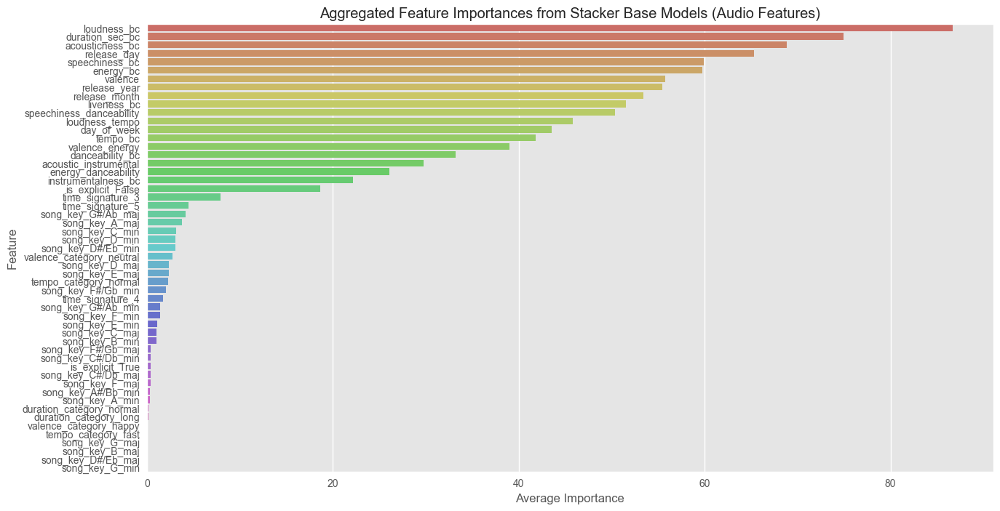

In [665]:
feature_importance_audio = pd.DataFrame()

# Iterate through each base model in the stacking model
for name, model in stack_model_audio.named_estimators_.items():
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        importances = model.feature_importances_
        
        # Create a DataFrame for the current model's feature importances
        temp_df = pd.DataFrame({
            'Feature': X.columns,
            'Importance': importances,
            'Model': name
        })
        
        # Append the DataFrame to the main DataFrame
        feature_importance_audio = pd.concat([feature_importance_audio, temp_df], axis=0)

# Aggregate feature importances by averaging
agg_feature_importance_audio = feature_importance_audio.groupby('Feature').agg({'Importance': 'mean'}).reset_index()

# Sort the aggregated feature importances by the mean importance in descending order
agg_feature_importance_audio = agg_feature_importance_audio.sort_values(by='Importance', ascending=False)

# Plot aggregated feature importances
plt.figure(figsize=(15, 8))
sns.barplot(data = agg_feature_importance_audio, y = 'Feature', x ='Importance', palette='hls')
plt.xlabel('Average Importance')
plt.ylabel('Feature')
plt.title('Aggregated Feature Importances from Stacker Base Models (Audio Features)') 
plt.show()

For the audio features scenario set the key features which contribute to the model and explain the variance in song popularity are loudness, duration, release_day and speechiness. Suggesting that songs can capitalise on these categories when creating songs.

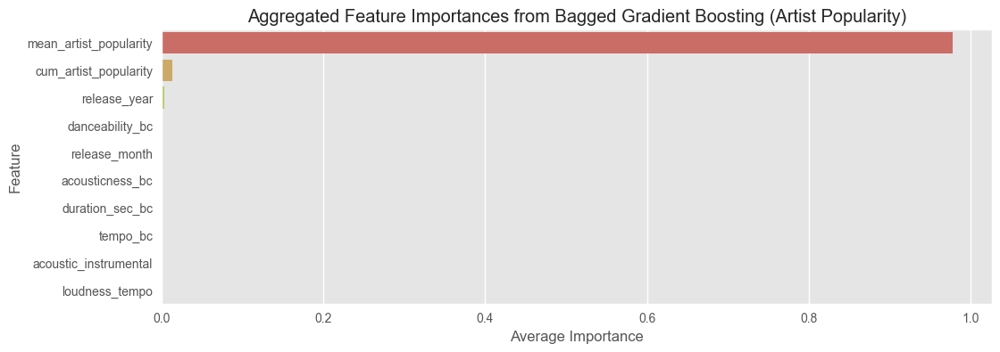

In [666]:
feature_importance_all = pd.DataFrame()

# Iterate through each base model in the stacking model
for estimator in bagged_gb.estimators_:
    if hasattr(estimator, 'feature_importances_'):
        # Get feature importances
        importances = estimator.feature_importances_
        
        # Create a DataFrame for the current model's feature importances
        temp_df_all = pd.DataFrame({
            'Feature': Z_train.columns,
            'Importance': importances,
        })
        
        # Append the DataFrame to the main DataFrame
        feature_importance_all = pd.concat([feature_importance_all, temp_df_all], axis=0)

# Aggregate feature importances by averaging
agg_feature_importance_all = feature_importance_all.groupby('Feature').agg({'Importance': 'mean'}).reset_index()

# Sort the aggregated feature importances by the mean importance in descending order
agg_feature_importance_all = agg_feature_importance_all.sort_values(by='Importance', ascending=False)

# Plot aggregated feature importances
plt.figure(figsize=(12, 4))
sns.barplot(data = agg_feature_importance_all, y = 'Feature', x ='Importance', palette='hls')
plt.xlabel('Average Importance')
plt.ylabel('Feature')
plt.title('Aggregated Feature Importances from Bagged Gradient Boosting (Artist Popularity)') 
plt.show()

As expected from the artist popularity scenario set, an artist's popularity is the largest determiner in predicting a song's popularity on Spotify.

### Predicted vs actual values

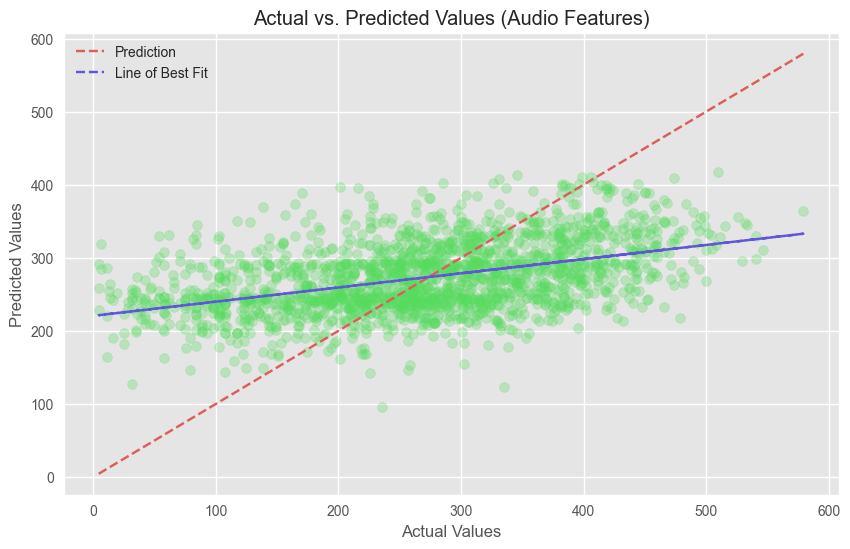

In [677]:
plt.figure(figsize=(10, 6))

# scatter plot of y_pred against y_test
plt.scatter(y_test, y_pred_audio, alpha=0.3, color = sns.color_palette('hls')[2])

# Prediction line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', color = sns.color_palette('hls')[0], label='Prediction')

# Line of best fit
slope, intercept = np.polyfit(y_test, y_pred_audio, 1)
best_fit_line = slope * y_test + intercept
plt.plot(y_test, best_fit_line, color= sns.color_palette('hls')[4], linestyle='dashed', label='Line of Best Fit')

plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Audio Features)')
plt.legend()
plt.show()

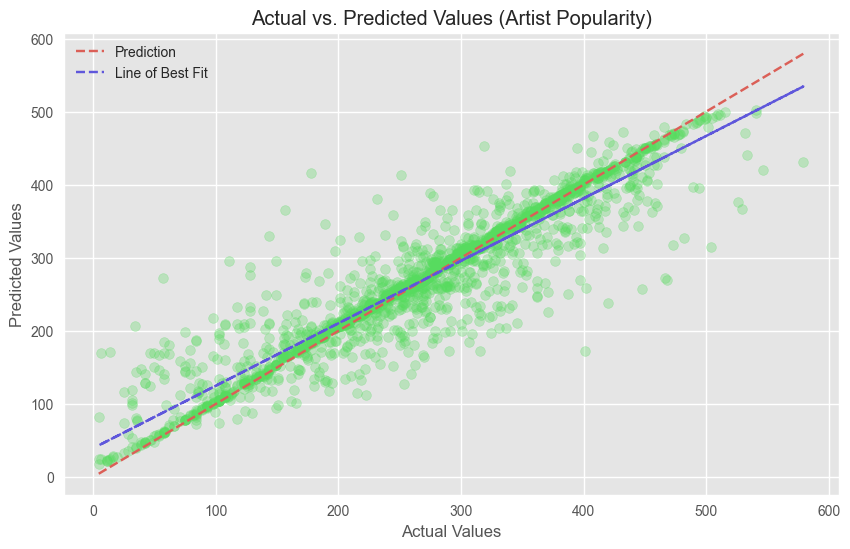

In [678]:
plt.figure(figsize=(10, 6))

# scatter plot of y_pred against y_test
plt.scatter(y_test, y_pred_all, alpha=0.3, color = sns.color_palette('hls')[2])

# Prediction line
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', color = sns.color_palette('hls')[0], label='Prediction')

# Line of best fit
slope, intercept = np.polyfit(y_test, y_pred_all, 1)
best_fit_line = slope * y_test + intercept
plt.plot(y_test, best_fit_line, color= sns.color_palette('hls')[4], linestyle='dashed', label='Line of Best Fit')

plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Artist Popularity)')
plt.legend()
plt.show()

## Conclusion

In conclusion, the test results reveal that audio features alone are insufficient to reliably predict song popularity. While audio attributes like tempo, loudness, and danceability do influence popularity, they don't capture the full picture, due to the influence of external factors such as artist popularity. The test results also suggested that artist popularity is a critical factor in predicting song popularity, reflecting the importance of an artist's existing fanbase and their influence on a song's success. It underscores that a well-known artist is more likely to produce popular tracks, regardless of the specific audio attributes of the song. For strategic initiatives focused on discovering or predicting hit songs, it is essential to consider both the artist’s popularity first and the song's audio features as supplementary. 

Some next steps would be tperpeform a seegrgrated analysis for well known artists vs lesser knownriirtsts to understand if audio fteurres have stronger predictive power. The model should be continuously updated and performance monitor as music preferences change over tied. Next steps would also be to ensure the model is scalable and can handle large volumes of data in existing Spotify infrastructure such as in recommendation systems. Recommendations to Spotify would include consistently highlighting the most popular artists, whether this be through promoting new releases in Spotify or targeted recommendations. But while this is important it is also key to explore evolving audio tren in tandem with artist popularity , as this can reveal potential hits early. 